#  PRUEBAS
Responble: Oscar Fernandez

Usuario: OFERNA4
Repositorio: https://github.com/adldigitallabs/data-bbog-integration-bau-adquisicion/

In [1]:
import os
os.chdir("/home/sagemaker-user/data-bbog-integration-fabrica-personas/src")
import data_bbog_integration_fabrica_personas.pipelines.raw.nodes as raw
import data_bbog_integration_fabrica_personas.pipelines.primary.nodes as primary
import data_bbog_integration_fabrica_personas.pipelines.feature.nodes as feature
import data_bbog_integration_fabrica_personas.pipelines.model_input.nodes as mi
import data_bbog_integration_fabrica_personas.pipelines.models.nodes as models
import data_bbog_integration_fabrica_personas.pipelines.backtesting.nodes as backtesting
import data_bbog_integration_fabrica_personas.pipelines.model_output.nodes as mo

In [2]:
import logging
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import pandas as pd
import time

from sklearn.metrics import silhouette_score
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


In [3]:
%load_ext kedro.ipython

[12/10/24 17:28:27] INFO     Resolved project path as:                                              ]8;id=968126;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=221123;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#139\139]8;;\
                             /home/sagemaker-user/data-bbog-integration-fabrica-personas.                          
                             To set a different path, run '%reload_kedro <project_root>'                           

[12/10/24 17:28:27] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=18976;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=530035;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=720268;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=537597;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/__init__.py:44: KedroDeprecationWarning:                             
                             'AbstractDataSet' has been renamed to 'AbstractDataset', and the alias                
                             will be removed in Kedro 0.19.0                                                       
                               return getattr(kedro.io.core, name)                                                 
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=99592;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=845179;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

[12/10/24 17:28:28] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=897562;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=27248;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/kedro/io/data_catalog.py:301: KedroDeprecationWarning:                        
                             Defining the 'layer' attribute at the top level is deprecated and will                
                             be removed in Kedro 0.19.0. Please move 'layer' inside the 'metadata'                 
                             -> 'kedro-viz' attributes. See                                                        
                             https://docs.kedro.org/en/latest/visualisation/kedro-viz_visualisation                
                             .html#visualise-layers for more information.                                          
                               warnings.warn(                                                                      
                                                                                                                   

                    INFO     Kedro project data-bbog-integration-fabrica-personas                   ]8;id=965660;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=620187;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#108\108]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=21238;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=265096;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/ipython/__init__.py#109\109]8;;\
                             'pipelines'                                                                           

In [4]:
params1= catalog.list
params = catalog.load("parameters")
#params

                    INFO     Loading data from 'parameters' (MemoryDataset)...                  ]8;id=824197;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=824426;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

In [5]:
import logging
logging.basicConfig()
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)

In [6]:
create_feature = catalog.load("master_primary_fp")
create_feature.head()

                    INFO     Loading data from 'master_primary_fp' (ParquetDataSet)...          ]8;id=125049;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=314455;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

,hashvalue1,periodo,generacion,estrato,departamento,ocupacion,perfil_riesgo,mcro_sum_numero_cuotas_total,aa_ciudad,mar_status,...,veh_cant_prev,veh_sum_saldo_promedio,veh_prom_plazo,veh_sum_numero_cuotas_pagadas,veh_sum_numero_cuotas_total,veh_sum_cuota_pactada,fid_cant_prev,fid_cant,fid_sum_encargo,ah_target_ap_group3
2,CC1000003981,202308,_millennial,2,bogota_d_c_,empleado_privado,1.0,0,_,s,...,0,0.0,0.0,0,0,0,0,0,0,0.0
4,CC1000020446,202308,_centennial,0,bogota_d_c_,empleado_privado,1.0,0,_,s,...,0,0.0,0.0,0,0,0,0,0,0,0.0
7,CC1000063639,202308,_centennial,0,bogota_d_c_,empleado_privado,1.0,0,_,s,...,0,0.0,0.0,0,0,0,0,0,0,0.0
10,CC1000066145,202308,_centennial,3,bogota_d_c_,empleado_privado,1.0,0,_,None,...,0,0.0,0.0,0,0,0,0,0,0,0.0
19,CC1000122707,202308,_centennial,0,bogota_d_c_,empleado_privado,1.0,0,_,s,...,0,0.0,0.0,0,0,0,0,0,0,0.0


## Creacion de variables

In [7]:
print(create_feature.shape)
create_feature = feature.calculate_new_variables_pd(create_feature, params)
model_homolog = feature.modelo_homologacion_regiones(params)
create_feature = feature.homologate_region(create_feature, model_homolog)

(10224733, 255)


[12/10/24 17:30:13] INFO     Se construyo la variable "mes" con exito!                                  ]8;id=639259;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=279190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

[12/10/24 17:30:18] INFO     Se construyo la variable "AAAA" con exito!                                 ]8;id=127421;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=567237;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "sum_saldo_activos" con exito!                    ]8;id=127526;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=131305;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "sum_saldo_pasivos" con exito!                    ]8;id=933706;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=778051;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

[12/10/24 17:30:19] INFO     Se construyo la variable "delta_ah_sum_monto_trx_credito" con exito!       ]8;id=678035;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=756448;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "delta_ah_sum_monto_trx_debito" con exito!        ]8;id=738798;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=458298;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "delta_tc_sum_facturacion_total" con exito!       ]8;id=124699;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=730107;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "num_activos_prev" con exito!                     ]8;id=541611;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=984071;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "num_pasivos_prev" con exito!                     ]8;id=950607;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=296756;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Se construyo la variable "num_prod_activos" con exito!                     ]8;id=789626;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=344104;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

[12/10/24 17:30:20] INFO     Se construyo la variable "num_prod_pasivos" con exito!                     ]8;id=188729;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=873693;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#83\83]8;;\

                    INFO     Nuevas variables calculadas completamente. Dimension de la data:           ]8;id=75826;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=587628;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#89\89]8;;\
                             (10224733, 266)                                                                       

                    INFO     Guardando el pickle de como se homologan las regiones...                  ]8;id=511188;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=959063;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#103\103]8;;\

[12/10/24 17:30:30] INFO     Ok la homologacion de la variable region con departamento                 ]8;id=660639;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=418550;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#136\136]8;;\

                    INFO     Tamaño de la data: (10224733, 267)                                        ]8;id=302693;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=472088;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#138\138]8;;\

## Eliminando variables no relevantes

In [ ]:
print(f'Variables a eliminar inicialmente ')
params['cols_to_drop']

In [ ]:
print('Configurando las variables que no vamos a quitar de las definidas para eliminar')
no_dropp = ['periodo','departamento','mar_status','ocupacion']
no_dropp

In [ ]:
print('Añadiendo otras columnas para eliminar')
add_drop = ['tipo_id']
add_drop

In [8]:
lista_drops = params['cols_to_drop']
for col in no_dropp:
    if col in lista_drops:
        lista_drops.remove(col)
params['cols_to_drop'] = list(set(lista_drops+add_drop))
print('Columnas a eliminar del analisis:')
params['cols_to_drop']

['aa_ciudad', 'segmento_cliente', 'mono_multi_prod', 'seg_comercial']

In [9]:
print(create_feature.shape)
create_feature = feature.eliminar_columnas(create_feature, params)
print(create_feature.shape)

[12/10/24 17:40:53] INFO     Segun la parametrizacion de la Farica se eliminara: ['aa_ciudad',         ]8;id=304697;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=226074;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#162\162]8;;\
                             'segmento_cliente', 'mono_multi_prod', 'seg_comercial']                               

[12/10/24 17:41:01] INFO     Tamaño de mi df: (10224733, 263)                                          ]8;id=709135;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=949376;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#165\165]8;;\

(10224733, 263)


**Otras columnas eliminadas manualmente:**

In [11]:
for col in create_feature:
    try:
        if (col.split("_")[1] == 'target') or (col in dropping):
           if (params['target'] != col) or (col in dropping):
               print('Eliminando: ',col) 
               create_feature.drop(col, axis = 1, inplace = True)
    except:
        pass

##### Preprocesamiento de datos

In [12]:
method = {'Outliers':{'Hacer_transformacion' : True,
                      'Sugerir_procesamiento' : True,
                      'method' : 'IQR',#Z-Score, IQR
                      'umbral' : 0.1 }}

method['id'] = params['id']
method['target'] = params['target']

In [13]:
res = mi.treatment_outliers(create_feature,method)
res.T

                    INFO     Iniciando la identificacion de outliers y definiendo como se              ]8;id=512847;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py\nodes.py]8;;\:]8;id=308668;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py#229\229]8;;\
                             transformaran los datos                                                               

[12/10/24 17:41:31] INFO     Detectando variables altamente dispersas ...                              ]8;id=635338;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py\nodes.py]8;;\:]8;id=523067;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py#250\250]8;;\

[12/10/24 17:42:26] INFO     Transformacion de nulos:                                                  ]8;id=361919;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py\nodes.py]8;;\:]8;id=404702;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py#286\286]8;;\

                    INFO     ['log' 'sqrt' 'sqrt3']                                                    ]8;id=795675;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py\nodes.py]8;;\:]8;id=46812;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py#287\287]8;;\

columns,perfil_riesgo,mcro_sum_numero_cuotas_total,fac_cant,fac_sum_numero_cuotas_pagadas,fac_prom_plazo,fac_cant_prev,fac_sum_numero_cuotas_total,fac_sum_pago_acumulado,fac_sum_saldo_corte,fac_sum_intereses,...,veh_sum_numero_cuotas_total,veh_sum_cuota_pactada,fid_cant_prev,fid_cant,fid_sum_encargo,sum_saldo_activos,sum_saldo_pasivos,delta_ah_sum_monto_trx_credito,delta_ah_sum_monto_trx_debito,delta_tc_sum_facturacion_total
Method,log,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt3,...,sqrt,sqrt3,sqrt,sqrt,sqrt,sqrt3,sqrt3,sqrt3,sqrt3,sqrt3


In [14]:
display(create_feature[res.index].head(3))

,perfil_riesgo,mcro_sum_numero_cuotas_total,fac_cant,fac_sum_numero_cuotas_pagadas,fac_prom_plazo,fac_cant_prev,fac_sum_numero_cuotas_total,fac_sum_pago_acumulado,fac_sum_saldo_corte,fac_sum_intereses,...,veh_sum_numero_cuotas_total,veh_sum_cuota_pactada,fid_cant_prev,fid_cant,fid_sum_encargo,sum_saldo_activos,sum_saldo_pasivos,delta_ah_sum_monto_trx_credito,delta_ah_sum_monto_trx_debito,delta_tc_sum_facturacion_total
2,1.0,0,0,0,0.0,0,0,0.0,0.0,0.0,...,0,0,0,0,0,10103960.0,1.992428e+07,0.0,0.0,0.0
4,1.0,0,0,0,0.0,0,0,0.0,0.0,0.0,...,0,0,0,0,0,94.0,5.710557e+06,0.0,0.0,0.0
7,1.0,0,0,0,0.0,0,0,0.0,0.0,0.0,...,0,0,0,0,0,7034.0,-1.500000e-01,0.0,0.0,0.0


In [15]:
create_feature2 = mi.adj_outliers(create_feature,res, method)
print(create_feature.shape)
print(create_feature2.shape)

[12/10/24 17:42:32] INFO     Comenzado a transformar los datos                                         ]8;id=976573;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py\nodes.py]8;;\:]8;id=679732;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/model_input/nodes.py#311\311]8;;\

(10224733, 263)
(10224733, 255)


In [16]:
display(create_feature2[res.index].head(3))

,perfil_riesgo,mcro_sum_numero_cuotas_total,fac_cant,fac_sum_numero_cuotas_pagadas,fac_prom_plazo,fac_cant_prev,fac_sum_numero_cuotas_total,fac_sum_pago_acumulado,fac_sum_saldo_corte,fac_sum_intereses,...,veh_sum_numero_cuotas_total,veh_sum_cuota_pactada,fid_cant_prev,fid_cant,fid_sum_encargo,sum_saldo_activos,sum_saldo_pasivos,delta_ah_sum_monto_trx_credito,delta_ah_sum_monto_trx_debito,delta_tc_sum_facturacion_total
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,216.187480,271.098788,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4.546836,178.741811,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,19.160233,-0.531329,0.0,0.0,0.0


In [17]:
create_feature2 = pd.concat([create_feature2,create_feature[create_feature.columns[~create_feature.columns.isin(create_feature2.columns)]]], axis = 1)
create_feature2

,periodo,estrato,perfil_riesgo,mcro_sum_numero_cuotas_total,antiguedad_meses,edad_anios,nivel_educativo,fac_cant,fac_sum_numero_cuotas_pagadas,fac_prom_plazo,...,num_prod_activos,num_prod_pasivos,hashvalue1,generacion,departamento,ocupacion,mar_status,grupo_etario,ah_target_ap_group3,region
2,202308,2,0.0,0.0,26,25,2.0,0.0,0.0,0.0,...,1,0,CC1000003981,_millennial,bogota_d_c_,empleado_privado,s,_joven,0.0,Region_Central
4,202308,0,0.0,0.0,5,22,2.0,0.0,0.0,0.0,...,1,0,CC1000020446,_centennial,bogota_d_c_,empleado_privado,s,_joven,0.0,Region_Central
7,202308,0,0.0,0.0,7,23,2.0,0.0,0.0,0.0,...,1,0,CC1000063639,_centennial,bogota_d_c_,empleado_privado,s,_joven,0.0,Region_Central
10,202308,3,0.0,0.0,43,23,NaN,0.0,0.0,0.0,...,1,0,CC1000066145,_centennial,bogota_d_c_,empleado_privado,None,_joven,0.0,Region_Central
19,202308,0,0.0,0.0,11,22,2.0,0.0,0.0,0.0,...,0,0,CC1000122707,_centennial,bogota_d_c_,empleado_privado,s,_joven,0.0,Region_Central
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31208130,202407,2,0.0,0.0,26,32,2.0,0.0,0.0,0.0,...,0,1,CC1022373333,_millennial,bogota_d_c_,empleado_privado,s,_adulto,1.0,Region_Central
31208159,202407,4,0.0,0.0,89,41,4.0,0.0,0.0,0.0,...,0,1,CC43914169,_millennial,antioquia,empleado_privado,s,_adulto,1.0,Region_Andina
31208163,202407,6,0.0,0.0,14,63,2.0,0.0,0.0,0.0,...,1,2,CC70554593,_baby_boomer,antioquia,empleado_privado,s,_persona_mayor,1.0,Region_Andina
31208238,202407,3,0.0,0.0,47,28,4.0,0.0,0.0,0.0,...,0,1,CC1143454554,_millennial,atlantico,empleado_privado,s,_adulto,1.0,Region_Caribe


## Analisis de significancia

In [ ]:
Y = create_feature[params['target']]
evaluar = []
import gc
gc.collect()
betas = pd.DataFrame()
probs_dist_all = pd.DataFrame()
ini_ = time.time()
ini_0 = time.time()
for t,col in enumerate(create_feature2):
    print(col,time.time()-ini_,t+1)
    gc.collect()
    if col not in [params['target'],params['id']]:
        X = create_feature2[[col]]
        if X.select_dtypes(include=['object', 'category']).shape[1] == 0:
            numeric = True
            pass
        else:
            numeric = False
            X = pd.get_dummies(X, drop_first=True).astype(int)
        X = (X-X.mean())/X.std()
        X = sm.add_constant(X)
        Y1 = Y[X.isnull().sum(axis = 1) == 0]
        X = X[X.isnull().sum(axis = 1) == 0]
        model = sm.Logit(Y1, X)
        result = model.fit()
        probs_dist = (1/(1+np.exp(X @ result.params.to_frame()))).rename(columns = {0:col})
        probs_dist_all = pd.concat([probs_dist_all,probs_dist], axis = 1)
        # variables significativas
        betas_i = pd.DataFrame()
        sign = (result.pvalues <= 0.01).replace(False, np.nan).dropna().index.tolist()
        if numeric == True:
            if col in sign:
                evaluar.append([col,numeric,[]])
                betas_i = result.params.to_frame().rename(columns = {0:col})
                betas_i = result.params.to_frame().rename(columns = {0:col})
                raw = betas_i.index.tolist()
                raw[raw.index(col)] = 'X1'
                betas_i.index = raw

        else:
            sign.remove('const')
            if len(sign)>=1:
                evaluar.append([col,numeric,[i[len(col)+1:] for i in sign]])
                betas_i = result.params.to_frame().rename(columns = {0:col})
        betas = pd.concat([betas,betas_i], axis = 1)
    gc.collect()
    ini_ = time.time()
probs_dist_all = pd.concat([Y,probs_dist_all], axis = 1)
ini_f = time.time() - ini_0

periodo 0.00040984153747558594
Optimization terminated successfully.
         Current function value: 0.090011
         Iterations 8
estrato 7.152557373046875e-06
Optimization terminated successfully.
         Current function value: 0.090337
         Iterations 8
perfil_riesgo 6.4373016357421875e-06
Optimization terminated successfully.
         Current function value: 0.090305
         Iterations 8
mcro_sum_numero_cuotas_total 6.4373016357421875e-06
Optimization terminated successfully.
         Current function value: 0.090339
         Iterations 8
antiguedad_meses 8.58306884765625e-06
Optimization terminated successfully.
         Current function value: 0.090211
         Iterations 8
edad_anios 7.867813110351562e-06
Optimization terminated successfully.
         Current function value: 0.090272
         Iterations 8
nivel_educativo 7.867813110351562e-06
Optimization terminated successfully.
         Current function value: 0.090732
         Iterations 8
fac_cant 7.62939453125e-06


[12/10/24 18:51:11] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=633558;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=369389;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/discrete/discrete_model.py:2385: RuntimeWarning:                  
                             overflow encountered in exp                                                           
                               return 1/(1+np.exp(-X))                                                             
                                                                                                                   

         Current function value: 0.090340
         Iterations: 35


[12/10/24 18:51:31] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=911579;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=507973;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum                    
                             Likelihood optimization failed to converge. Check mle_retvals                         
                               warnings.warn("Maximum Likelihood optimization failed to "                          
                                                                                                                   

ratio_deuda_ingresos 1.0728836059570312e-05


[12/10/24 18:51:59] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=579916;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=101183;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/discrete/discrete_model.py:2385: RuntimeWarning:                  
                             overflow encountered in exp                                                           
                               return 1/(1+np.exp(-X))                                                             
                                                                                                                   

[12/10/24 18:52:18] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=57286;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=343201;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/discrete/discrete_model.py:2443: RuntimeWarning:                  
                             divide by zero encountered in log                                                     
                               return np.sum(np.log(self.cdf(q * linpred)))                                        
                                                                                                                   

         Current function value: inf
         Iterations: 35


[12/10/24 18:52:19] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=414928;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=746461;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum                    
                             Likelihood optimization failed to converge. Check mle_retvals                         
                               warnings.warn("Maximum Likelihood optimization failed to "                          
                                                                                                                   

                    WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=605934;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=532886;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/pandas/core/internals/blocks.py:393: RuntimeWarning: overflow                 
                             encountered in exp                                                                    
                               result = func(self.values, **kwargs)                                                
                                                                                                                   

ratio_deuda_ingresos_std_6 1.1682510375976562e-05
Optimization terminated successfully.
         Current function value: 0.090339
         Iterations 8
ratio_deuda_ingresos_std_3 1.239776611328125e-05
Optimization terminated successfully.
         Current function value: 0.090339
         Iterations 8
ratio_deuda_ingresos_mean_6 1.0967254638671875e-05


[12/10/24 18:53:46] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=458823;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=779437;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/discrete/discrete_model.py:2385: RuntimeWarning:                  
                             overflow encountered in exp                                                           
                               return 1/(1+np.exp(-X))                                                             
                                                                                                                   

         Current function value: 0.090337
         Iterations: 35


[12/10/24 18:54:05] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=351914;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=783318;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum                    
                             Likelihood optimization failed to converge. Check mle_retvals                         
                               warnings.warn("Maximum Likelihood optimization failed to "                          
                                                                                                                   

ratio_deuda_ingresos_std_2 1.0728836059570312e-05
Optimization terminated successfully.
         Current function value: 0.090339
         Iterations 8
ratio_deuda_ingresos_mean_2 9.775161743164062e-06


[12/10/24 18:55:03] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=107220;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=463599;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/discrete/discrete_model.py:2385: RuntimeWarning:                  
                             overflow encountered in exp                                                           
                               return 1/(1+np.exp(-X))                                                             
                                                                                                                   

         Current function value: 0.090337
         Iterations: 35


[12/10/24 18:55:23] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=155259;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=303871;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum                    
                             Likelihood optimization failed to converge. Check mle_retvals                         
                               warnings.warn("Maximum Likelihood optimization failed to "                          
                                                                                                                   

cs_sum_saldo 1.1205673217773438e-05
Optimization terminated successfully.
         Current function value: 0.090284
         Iterations 9
cs_cant_mora 1.0251998901367188e-05
Optimization terminated successfully.
         Current function value: 0.090318
         Iterations 9
cs_sum_monto_cupo_rotativo 1.1444091796875e-05
Optimization terminated successfully.
         Current function value: 0.090296
         Iterations 8
cs_sum_intereses 1.1920928955078125e-05
Optimization terminated successfully.
         Current function value: 0.090298
         Iterations 8
cs_cant_prev 1.0251998901367188e-05
Optimization terminated successfully.
         Current function value: 0.090245
         Iterations 8
cs_sum_pago_real 1.1682510375976562e-05
Optimization terminated successfully.
         Current function value: 0.090279
         Iterations 9
cs_cant 8.58306884765625e-06
Optimization terminated successfully.
         Current function value: 0.090245
         Iterations 8
cs_sum_cupo_disponible

[12/10/24 19:22:52] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=707615;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=331840;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum                    
                             Likelihood optimization failed to converge. Check mle_retvals                         
                               warnings.warn("Maximum Likelihood optimization failed to "                          
                                                                                                                   

mar_status 8.58306884765625e-06
         Current function value: 0.090261
         Iterations: 35


[12/10/24 19:23:58] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=320543;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=281611;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum                    
                             Likelihood optimization failed to converge. Check mle_retvals                         
                               warnings.warn("Maximum Likelihood optimization failed to "                          
                                                                                                                   

grupo_etario 7.3909759521484375e-06
Optimization terminated successfully.
         Current function value: 0.090311
         Iterations 8
ah_target_ap_group3 9.059906005859375e-06
region 6.67572021484375e-06
Optimization terminated successfully.
         Current function value: 0.090261
         Iterations 9


In [21]:
print(ini_f/60, "min")

101.4454963405927 min


In [22]:
betas.loc[['const','X1']].T.dropna() # betas de variables continuas

,const,X1
periodo,-4.014623,0.194234
estrato,-3.996625,-0.012329
perfil_riesgo,-3.998787,-0.074640
antiguedad_meses,-4.003774,-0.124486
edad_anios,-4.000254,-0.088322
...,...,...
delta_tc_sum_facturacion_total,-3.996864,0.025455
num_activos_prev,-4.100352,-0.509005
num_pasivos_prev,-4.002515,0.107557
num_prod_activos,-4.112850,-0.541637


In [23]:
betas[betas.loc[['const','X1']].T.isnull().sum(axis = 1).replace(0,np.nan).dropna().index] # betas de variables discretas

,generacion,departamento,ocupacion,mar_status,grupo_etario,region
const,-4.002890,-4.004186,-4.004174,-4.000952,-3.997981,-4.001461
X1,NaN,NaN,NaN,NaN,NaN,NaN
generacion__centennial,0.046420,NaN,NaN,NaN,NaN,NaN
generacion__generacion_x,-0.077911,NaN,NaN,NaN,NaN,NaN
generacion__millennial,0.036160,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
region_Region_Andina,NaN,NaN,NaN,NaN,NaN,0.428695
region_Region_Caribe,NaN,NaN,NaN,NaN,NaN,0.271021
region_Region_Central,NaN,NaN,NaN,NaN,NaN,0.345407
region_Region_Orinoquia,NaN,NaN,NaN,NaN,NaN,0.143488


In [24]:
variables_sign = [a for a,b,c in evaluar]
print('Variables Significativas: ',len(variables_sign),'.Total de variables: ',create_feature.shape[1]-1) 

Variables Significativas:  233 .Total de variables:  262


**y en las variables continuas...**

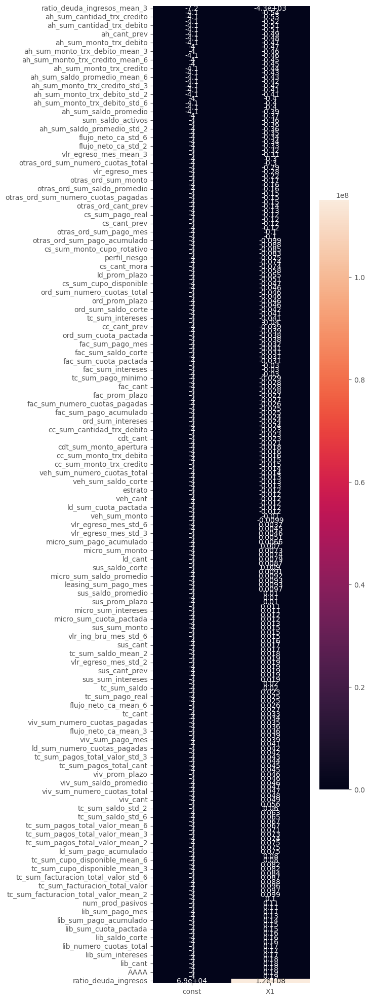

In [27]:
betas_num_sign = betas.loc[['const','X1']].T.dropna() # betas de variables continuas
betas_num_sign = betas_num_sign.loc[betas_num_sign.index.isin(variables_sign)]
betas_num_sign = betas_num_sign.sort_values(by='X1')
plt.figure(figsize = (5,25))
plt.subplot(111)
plt.style.use('ggplot')
sns.heatmap(betas_num_sign, annot = True, fmt = '0.2g')
plt.show()

**Probs de variables sin presencia de inputs**

In [28]:
probs_sign = 1/(1+np.exp(betas_num_sign['const']))
display(probs_sign.sort_values().to_frame())

[12/10/24 19:27:42] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=917138;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=976096;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/pandas/core/arraylike.py:399: RuntimeWarning: overflow                        
                             encountered in exp                                                                    
                               result = getattr(ufunc, method)(*inputs, **kwargs)                                  
                                                                                                                   

,const
ratio_deuda_ingresos,0.000000
nivel_educativo,0.981863
leasing_sum_numero_cuotas_total,0.981953
vlr_egreso_mes_std_6,0.981953
leasing_prom_plazo,0.981953
...,...
num_activos_prev,0.983703
ah_cant_prev,0.983773
num_prod_activos,0.983902
ah_cant,0.983986


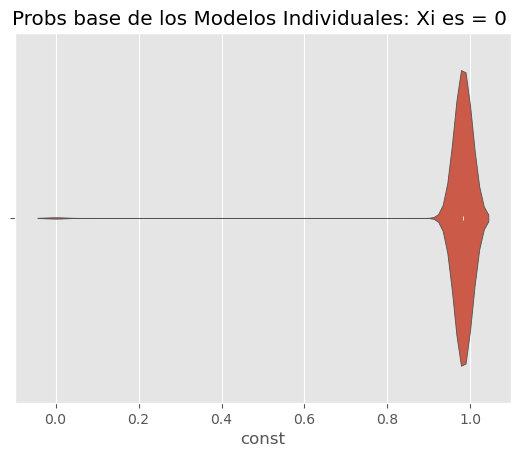

In [29]:
plt.title('Probs base de los Modelos Individuales: Xi es = 0 ')
sns.violinplot(probs_sign, orient = 'h')
plt.show()

[12/10/24 19:27:51] WARNING  /home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-p ]8;id=156369;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=910217;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                             ackages/pandas/core/arraylike.py:399: RuntimeWarning: overflow                        
                             encountered in exp                                                                    
                               result = getattr(ufunc, method)(*inputs, **kwargs)                                  
                                                                                                                   

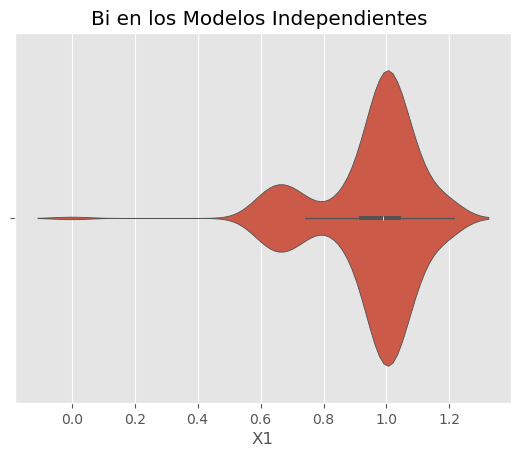

In [30]:
probs_sign =np.exp(betas_num_sign['X1'])
plt.title('Bi en los Modelos Independientes ')
sns.violinplot(probs_sign, orient = 'h')
plt.show()

**Analizando las probs de todos los modelos individuales:**

In [ ]:
x1 = probs_dist_all[variables_sign]
z = [(i.split("_")[0], i) for i in x1.columns]
x1.columns = pd.MultiIndex.from_tuples(z, names=['grupo', 'variable'])
#x1 = x1.corr().sort_index()
#x1 = x1[x1.index]
x1.head()

In [44]:
df_temp = [t[0] for t in x1.columns]
z = list(set(df_temp))
y = [i for i in z if sum(i ==np.array(df_temp))==1]
y


[
    'AAAA',
    'ocupacion',
    'estrato',
    'delta',
    'periodo',
    'region',
    'antiguedad',
    'departamento',
    'mar',
    'generacion',
    'mes',
    'perfil',
    'nivel',
    'edad',
    'grupo'
]

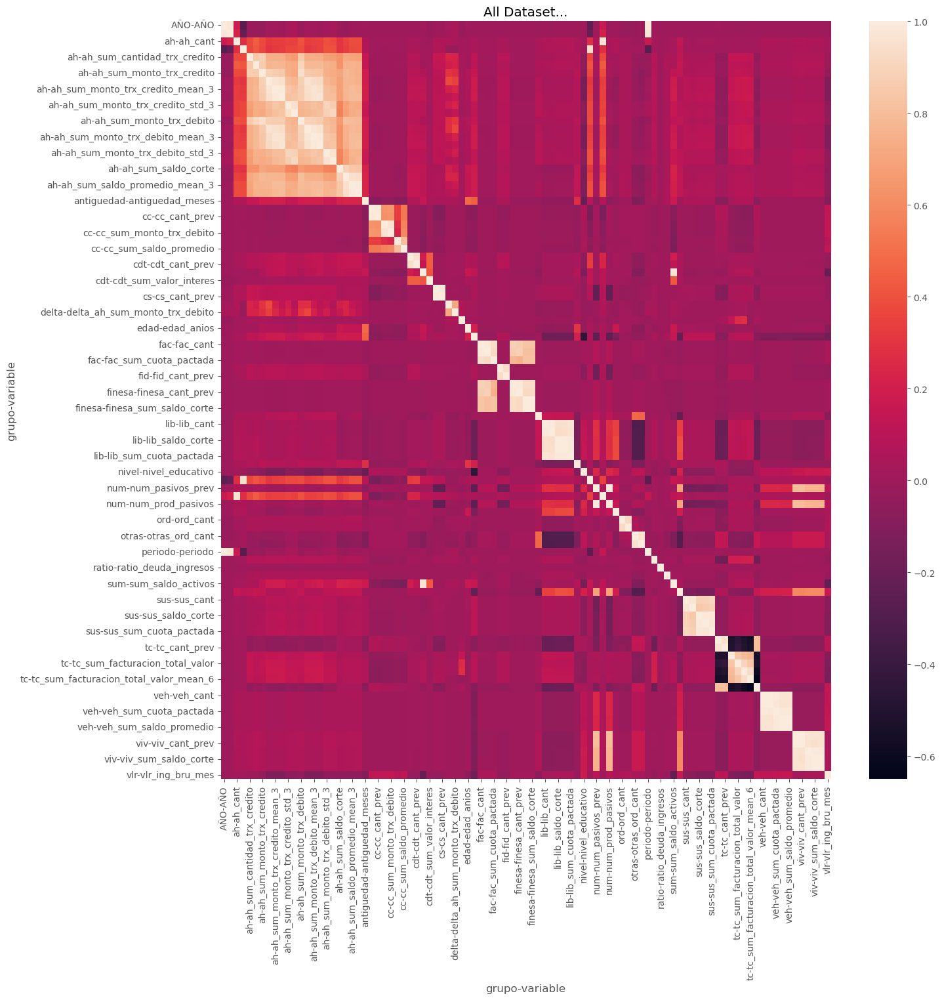

In [30]:
plt.figure(figsize = (15,15))
plt.title(f'All Dataset...')
sns.heatmap(x1)
plt.show()

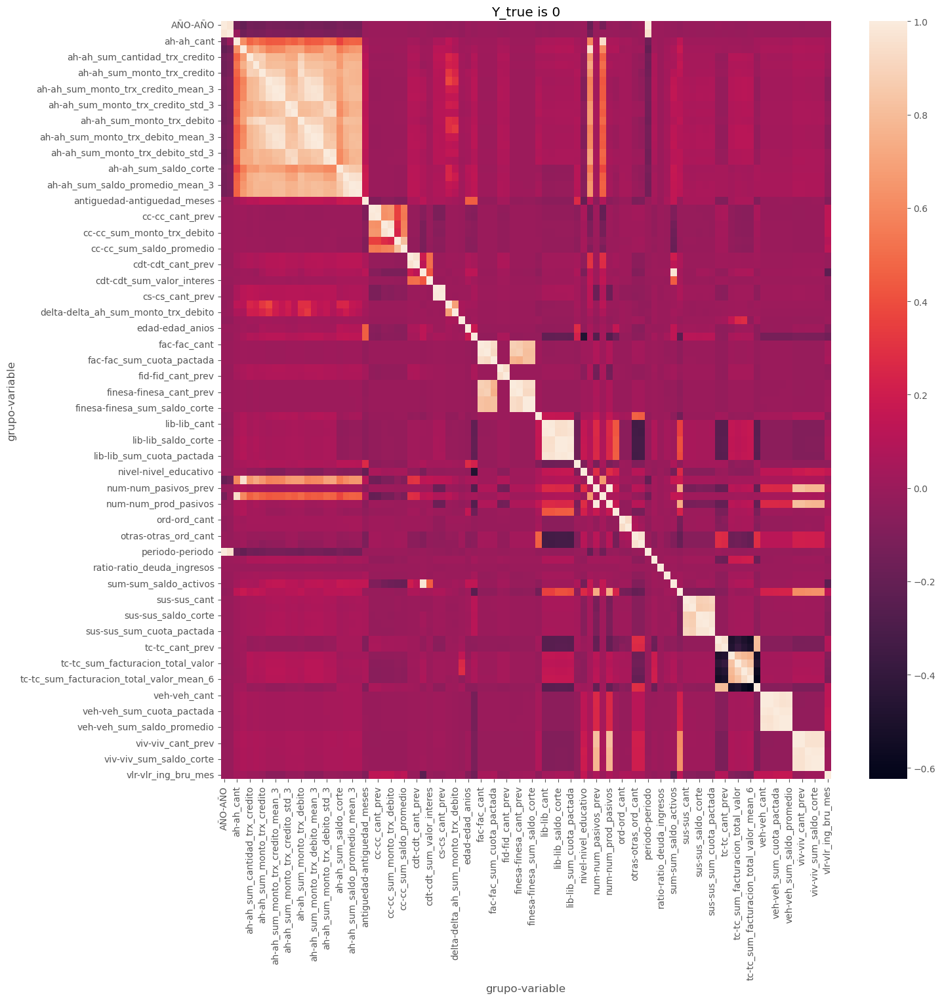

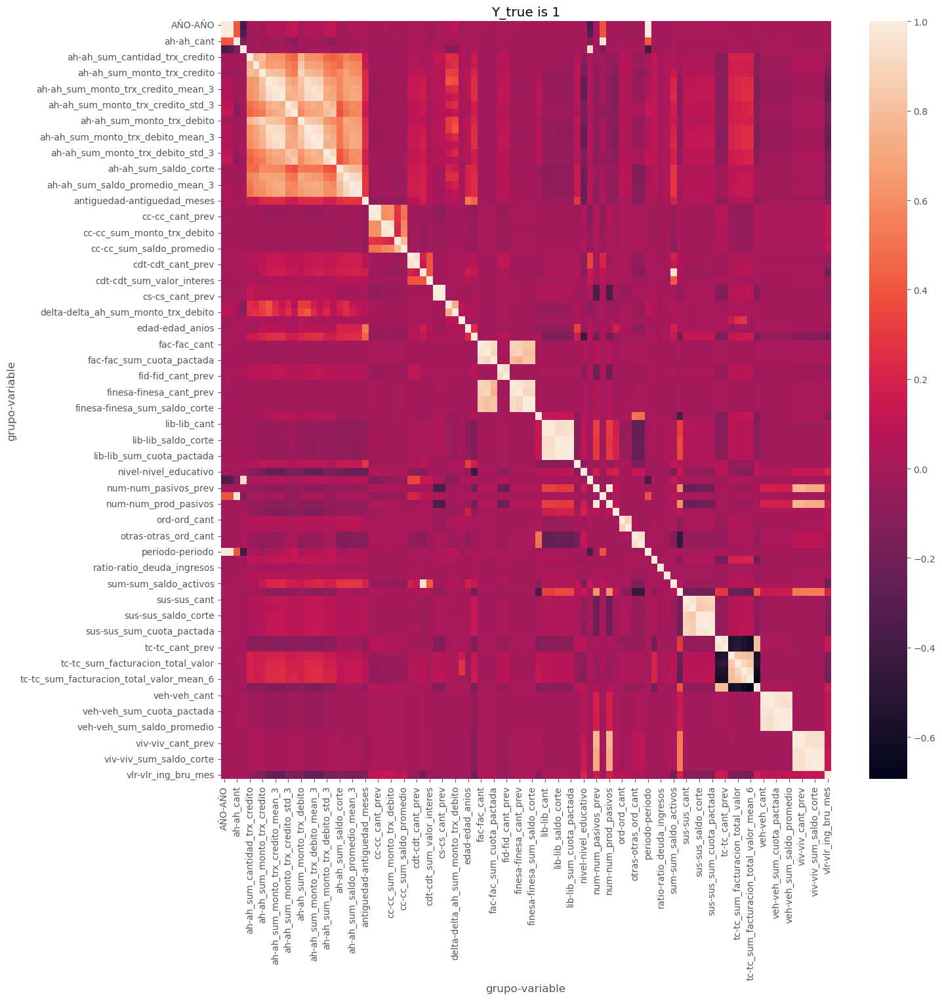

In [31]:
for i in [0,1]:
    x = probs_dist_all[variables_sign]
    x = x[create_feature[params['target']] == i]
    z = [(i.split("_")[0], i) for i in x.columns]
    x.columns = pd.MultiIndex.from_tuples(z, names=['grupo', 'variable'])
    x = x.corr().sort_index()
    x = x[x.index]
    plt.figure(figsize = (15,15))
    plt.title(f'Y_true is {i}')
    sns.heatmap(x)
    plt.show()

In [45]:
import plotly #plotly-5.24.1
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D  # Necesario para gráficos 3D

## Realizando un modelo con regulizador Ridge

In [46]:
X_train = create_feature2[variables_sign].select_dtypes(exclude=['object', 'bool'])
y_train = create_feature2[params['target']]
y_train.head()

In [47]:
X_categorical = create_feature2[variables_sign].select_dtypes(include=['object', 'bool'])
X_categorical1 = pd.get_dummies(X_categorical, drop_first=False).astype(int)
print(X_categorical.shape)
print(X_categorical1.shape)
X_train = pd.concat([X_train,X_categorical1], axis = 1)
X_train.shape

(10224733, 6)
(10224733, 70)


(10224733, 297)

In [48]:
nulos = (X_train.isnull().sum() / X_train.shape[0]).replace(0,np.nan).dropna()
nulos


nivel_educativo    0.028205
dtype: float64

In [52]:
print(X_train['nivel_educativo'].unique())
X_train_standard = X_train.copy()
X_train_standard['nivel_educativo'] = X_train['nivel_educativo'].fillna(X_train['nivel_educativo'].mean())
print(X_train_standard['nivel_educativo'].unique())

[2.         2.60691554 4.         3.         1.         5.
 0.        ]
[2.         2.60691554 4.         3.         1.         5.
 0.        ]


In [53]:
#X_train_standard = X_train_standard.drop(nulos.index, axis = 1)
X_train_standard = (X_train_standard-X_train_standard.mean())/X_train_standard.std()
X_train_standard.shape

(10224733, 297)

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

# Definir el modelo MLPClassifier con regularización L1
model = MLPClassifier(hidden_layer_sizes=(5), activation='relu', 
                      solver='adam', max_iter=500, 
                      alpha=0.01, random_state=42)

# Entrenar el modelo
model.fit(X_train_standard.values, y_train.values)

MLPClassifier(alpha=0.01, hidden_layer_sizes=5, max_iter=500, random_state=42)

In [ ]:
W11 = pd.DataFrame(model.coefs_[0], index = X_train_standard.columns, columns = [f'N_{i}' for i in range(1,6,1)])
W12 = pd.DataFrame(model.coefs_[1], index = [f'N_{i}' for i in range(1,6,1)], columns = [f'N_{i}2' for i in range(1,2,1)])
W11.head()

,N_1,N_2,N_3,N_4,N_5
periodo,0.178970,-0.074124,-0.930468,-1.850733e-316,0.439692
estrato,-0.009373,-0.271918,-0.058227,-1.006166e-316,-0.180364
perfil_riesgo,0.103389,-0.010833,0.007996,2.030582e-316,-0.139025
antiguedad_meses,-0.040603,-0.027295,0.145687,1.946152e-316,0.107760
edad_anios,0.143200,-0.245937,0.206488,6.316293e-318,-0.291784


In [ ]:
W01 = pd.DataFrame([model.intercepts_[0]]*W11.shape[0], columns = [f'N_{i}' for i in range(1,6,1)], index = X_train_standard.columns)
# El B0 se distirbuye en cada input
W01 = W01/W11.shape[0]
W01.head()

,N_1,N_2,N_3,N_4,N_5
periodo,-0.007615,0.002637,0.015814,-0.000548,-0.001402
estrato,-0.007615,0.002637,0.015814,-0.000548,-0.001402
perfil_riesgo,-0.007615,0.002637,0.015814,-0.000548,-0.001402
antiguedad_meses,-0.007615,0.002637,0.015814,-0.000548,-0.001402
edad_anios,-0.007615,0.002637,0.015814,-0.000548,-0.001402


In [ ]:
importance_RNN = (W11+W01).abs() @ W12.abs()
importance_RNN = importance_RNN.rename(columns = {'N_12':'NN_Olden'})
importance_RNN.sort_values(by = 'NN_Olden', ascending = False).head()

,NN_Olden
mes,0.678634
periodo,0.475165
ah_cant,0.459792
ld_sum_intereses,0.414136
AAAA,0.409589


### Comparacion de Logit individual vs Red Neuronal:

**Variables Categoricas:**

In [ ]:
importance_RNN_cat = importance_RNN.loc[X_categorical1.columns.tolist()]
importance_RNN_cat

,NN_Olden
generacion__baby_boomer,0.108464
generacion__centennial,0.045283
generacion__generacion_x,0.050078
generacion__millennial,0.077766
departamento_amazonas,0.117577
...,...
region_Region_Andina,0.039125
region_Region_Caribe,0.038332
region_Region_Central,0.095804
region_Region_Orinoquia,0.036533


In [61]:
# betas de variables discretas
betas_cat = betas[betas.loc[['const','X1']].T.isnull().sum(axis = 1).replace(0,np.nan).dropna().index].dropna(how = 'all')
betas_cat1 = betas_cat.drop('const', axis = 0)
betas_cat1['B1 Logit'] = betas_cat1.sum(axis = 1)
betas_cat1['variable'] = None
for col in betas_cat1.columns:
    if col not in ['variable','B1 Logit']:
        betas_cat1.loc[betas_cat1[col].dropna().index.tolist(),'variable'] = col
betas_cat1 = betas_cat1[['B1 Logit','variable']]
betas_cat1

,B1 Logit,variable
generacion__centennial,0.046420,generacion
generacion__generacion_x,-0.077911,generacion
generacion__millennial,0.036160,generacion
departamento_antioquia,0.255643,departamento
departamento_arauca,0.028026,departamento
...,...,...
region_Region_Andina,0.428695,region
region_Region_Caribe,0.271021,region
region_Region_Central,0.345407,region
region_Region_Orinoquia,0.143488,region


In [62]:
importance_RNN_cat.loc[~importance_RNN_cat.index.isin(betas_cat1.index)]

,NN_Olden
generacion__baby_boomer,0.108464
departamento_amazonas,0.117577
ocupacion_artista,0.070893
mar_status_c,0.071065
grupo_etario__adulto,0.094232
region_Other_Region,0.110448


In [65]:
replace_null = {
'generacion__baby_boomer':'baby_boomer',
'departamento_amazonas':'amazonas',
'ocupacion_artista':'artista',
'mar_status_c':'c',
'grupo_etario__adulto':'adulto',
'region_Other_Region':'Other_Region',
}

In [67]:
analisis_cat =  pd.concat([importance_RNN_cat,betas_cat1], axis = 1)
analisis_cat['caracter'] = None
for col in analisis_cat.index:
    if col not in ['caracter','variable']:
        if col not in replace_null:
            analisis_cat.loc[col,'caracter'] = col[len(analisis_cat.loc[col,'variable'])+1:]
        else:
            analisis_cat.loc[col,'caracter'] = replace_null[col]
            analisis_cat.loc[col,'variable'] = col[:-len(replace_null[col])-1]
analisis_cat.index.name = 'variable_caracter'
analisis_cat = analisis_cat.reset_index()
analisis_cat2 = analisis_cat[analisis_cat.isnull().sum(axis = 1)<1]
analisis_cat3 = analisis_cat[analisis_cat.isnull().sum(axis = 1)>=1]
analisis_cat3

,variable_caracter,NN_Olden,B1 Logit,variable,caracter
0,generacion__baby_boomer,0.108464,NaN,generacion_,baby_boomer
4,departamento_amazonas,0.117577,NaN,departamento,amazonas
37,ocupacion_artista,0.070893,NaN,ocupacion,artista
52,mar_status_c,0.071065,NaN,mar_status,c
60,grupo_etario__adulto,0.094232,NaN,grupo_etario_,adulto
63,region_Other_Region,0.110448,NaN,region,Other_Region


In [68]:
# Calcular el percentil 80 de la columna 'B1'
pctg = np.round(25/importance_RNN.shape[0],2) # 25 variables de todas las posibles
print('Rango de significancia:',pctg)
cat_max_logit = analisis_cat2['B1 Logit'].quantile(1-pctg)
cat_min_logit = analisis_cat2['B1 Logit'].quantile(pctg)

cat_max_olden = analisis_cat2['NN_Olden'].quantile(1-pctg)
max_olden = importance_RNN['NN_Olden'].quantile(1-pctg)

max_logit = pd.concat([analisis_cat2['B1 Logit'],betas_num_sign['X1']]).quantile(1-pctg)
min_logit = pd.concat([analisis_cat2['B1 Logit'],betas_num_sign['X1']]).quantile(pctg)

print('Eje Horizontal...')
print(min_logit,cat_min_logit,cat_max_logit,max_logit)
print('Eje Vertical...')
print(cat_max_olden,max_olden)

Rango de significancia: 0.08
Eje Horizontal...
-0.39706809331980525 -0.017962497757620367 0.2537382134290253 0.14256259099797938
Eje Vertical...
0.13748171390401914 0.19190653791345477


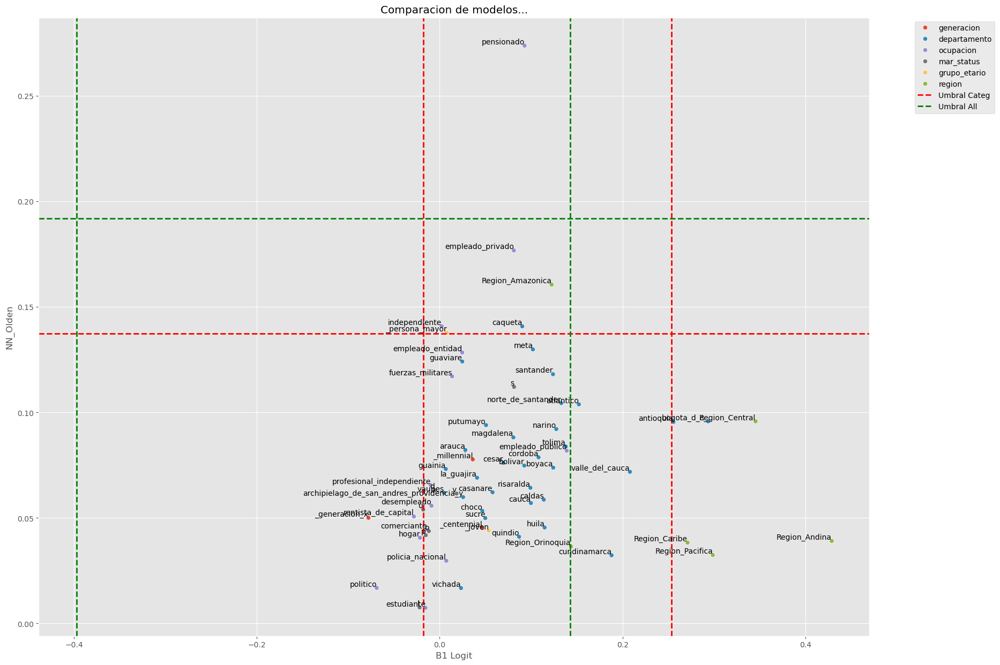

In [81]:
plt.figure(figsize = (20,15))
plt.title('Comparacion de modelos...')
sns.scatterplot(analisis_cat2, x = 'B1 Logit',y ='NN_Olden', hue = 'variable')

plt.axvline(cat_min_logit, color='red', linestyle='--', linewidth=2, label='Umbral Categ')
plt.axvline(cat_max_logit, color='red', linestyle='--', linewidth=2)
plt.axhline(cat_max_olden, color='red', linestyle='--', linewidth=2)

plt.axhline(max_olden, color='green', linestyle='--', linewidth=2, label = 'Umbral All')
plt.axvline(max_logit, color='green', linestyle='--', linewidth=2)
plt.axvline(min_logit, color='green', linestyle='--', linewidth=2)

# Añadir etiquetas a los puntos
for i in range(len(analisis_cat2)):
    plt.text(analisis_cat2['B1 Logit'].values[i], 
             analisis_cat2['NN_Olden'].values[i], 
             analisis_cat2['caracter'].values[i], 
             fontsize=10,  # Tamaño de la fuente
             color='black',  # Color de la fuente
             ha='right',  # Alineación horizontal
             va='bottom')  # Alineación vertical

# Mover la leyenda fuera de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**Logit:**

In [71]:
# sugerencia logit (linea roja)
analisis_cat2[(analisis_cat2['B1 Logit'] >=cat_max_logit)|(analisis_cat2['B1 Logit'] <=cat_min_logit)]

,variable_caracter,NN_Olden,B1 Logit,variable,caracter
2,generacion__generacion_x,0.050078,-0.077911,generacion,_generacion_x
5,departamento_antioquia,0.095543,0.255643,departamento,antioquia
9,departamento_bogota_d_c_,0.095804,0.293608,departamento,bogota_d_c_
45,ocupacion_hogar,0.040619,-0.021527,ocupacion,hogar
49,ocupacion_politico,0.016864,-0.068894,ocupacion,politico
51,ocupacion_rentista_de_capital,0.050717,-0.028217,ocupacion,rentista_de_capital
54,mar_status_l,0.007587,-0.021991,mar_status,l
58,mar_status_u,0.053963,-0.018062,mar_status,u
65,region_Region_Andina,0.039125,0.428695,region,Region_Andina
66,region_Region_Caribe,0.038332,0.271021,region,Region_Caribe


In [72]:
# sugerencia logit acido (linea verde)
analisis_cat2[(analisis_cat2['B1 Logit'] >=max_logit)|(analisis_cat2['B1 Logit'] <=min_logit)]

,variable_caracter,NN_Olden,B1 Logit,variable,caracter
5,departamento_antioquia,0.095543,0.255643,departamento,antioquia
8,departamento_atlantico,0.103876,0.152163,departamento,atlantico
9,departamento_bogota_d_c_,0.095804,0.293608,departamento,bogota_d_c_
19,departamento_cundinamarca,0.032336,0.187921,departamento,cundinamarca
34,departamento_valle_del_cauca,0.071887,0.208014,departamento,valle_del_cauca
65,region_Region_Andina,0.039125,0.428695,region,Region_Andina
66,region_Region_Caribe,0.038332,0.271021,region,Region_Caribe
67,region_Region_Central,0.095804,0.345407,region,Region_Central
68,region_Region_Orinoquia,0.036533,0.143488,region,Region_Orinoquia
69,region_Region_Pacifica,0.032443,0.298631,region,Region_Pacifica


**Red Neuronal:**

In [73]:
# sugerencia red (linea roja)
analisis_cat2[(analisis_cat2['NN_Olden'] >=cat_max_olden)]

,variable_caracter,NN_Olden,B1 Logit,variable,caracter
13,departamento_caqueta,0.140835,0.090250,departamento,caqueta
41,ocupacion_empleado_privado,0.176800,0.081093,ocupacion,empleado_privado
46,ocupacion_independiente,0.140860,0.002164,ocupacion,independiente
47,ocupacion_pensionado,0.273874,0.092812,ocupacion,pensionado
62,grupo_etario__persona_mayor,0.137797,0.007738,grupo_etario,_persona_mayor
64,region_Region_Amazonica,0.160610,0.122314,region,Region_Amazonica


In [74]:
# sugerencia red acido (linea verde)
analisis_cat2[(analisis_cat2['NN_Olden'] >=max_olden)]

,variable_caracter,NN_Olden,B1 Logit,variable,caracter
47,ocupacion_pensionado,0.273874,0.092812,ocupacion,pensionado


**Analisis de las caracteristicas por fuera del Logit**

In [75]:
analisis_cat3

,variable_caracter,NN_Olden,B1 Logit,variable,caracter
0,generacion__baby_boomer,0.108464,NaN,generacion_,baby_boomer
4,departamento_amazonas,0.117577,NaN,departamento,amazonas
37,ocupacion_artista,0.070893,NaN,ocupacion,artista
52,mar_status_c,0.071065,NaN,mar_status,c
60,grupo_etario__adulto,0.094232,NaN,grupo_etario_,adulto
63,region_Other_Region,0.110448,NaN,region,Other_Region


In [76]:
# sugerencia red 
analisis_cat3[(analisis_cat3['NN_Olden'] >=cat_max_olden)]

,variable_caracter,NN_Olden,B1 Logit,variable,caracter


In [77]:
# sugerencia red acido
analisis_cat3[(analisis_cat3['NN_Olden'] >=max_olden)]

,variable_caracter,NN_Olden,B1 Logit,variable,caracter


**Correlacion de las probs logit de los caracteres relevantes frente al resto**

In [ ]:
res_cat_var = x1.loc[[i.split("_")[0] for i in analisis_cat2['variable'].unique()]]
plt.figure(figsize = (15,3))
plt.title(f'All Categorical vs All Variable...')
sns.heatmap(res_cat_var)
plt.show()

**¿Que tan similares son los resultados de las variables categoricas frente al resto?**

Grafico filtrado con una correlacion $>0.3$

In [ ]:
plt.figure(figsize = (15,3))
plt.title(f'All Categorical vs All Variable...')
sns.heatmap(res_cat_var[((res_cat_var > 0.3).sum()>=1).replace(False,np.nan).dropna().index.tolist()], annot  = True, fmt = '0.2%')
plt.show()

## Analisis en variables categoricas

[12/10/24 22:23:59] WARNING  /tmp/ipykernel_4764/1391706365.py:9: FutureWarning:                    ]8;id=804544;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=923947;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                                                                                                                   
                             Passing `palette` without assigning `hue` is deprecated and will be                   
                             removed in v0.14.0. Assign the `y` variable to `hue` and set                          
                             `legend=False` for the same effect.                                                   
                                                                                                                   
                               ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')                
                                                                                                                   

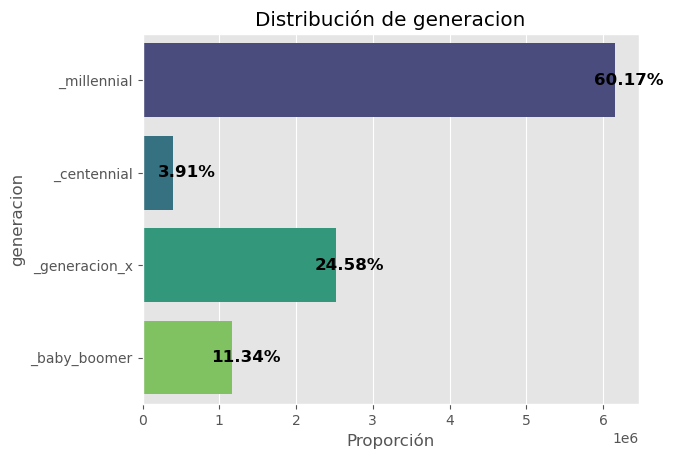

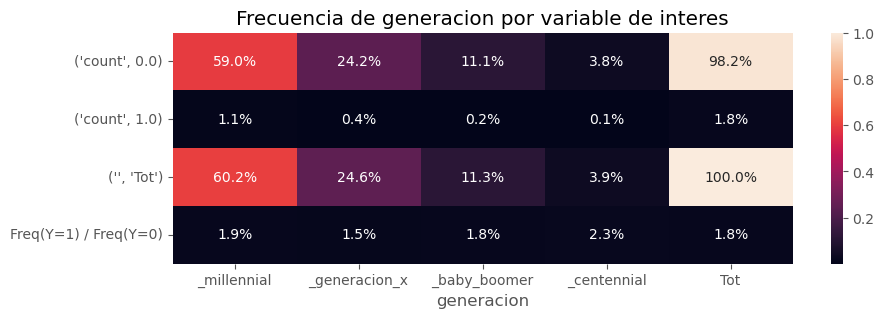

---------------------------------------------


[12/10/24 22:24:22] WARNING  /tmp/ipykernel_4764/1391706365.py:9: FutureWarning:                    ]8;id=283480;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=419912;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                                                                                                                   
                             Passing `palette` without assigning `hue` is deprecated and will be                   
                             removed in v0.14.0. Assign the `y` variable to `hue` and set                          
                             `legend=False` for the same effect.                                                   
                                                                                                                   
                               ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')                
                                                                                                                   

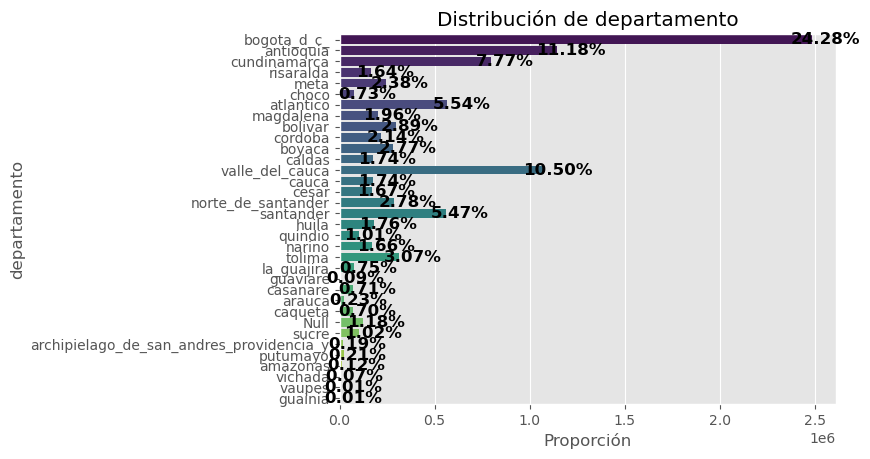

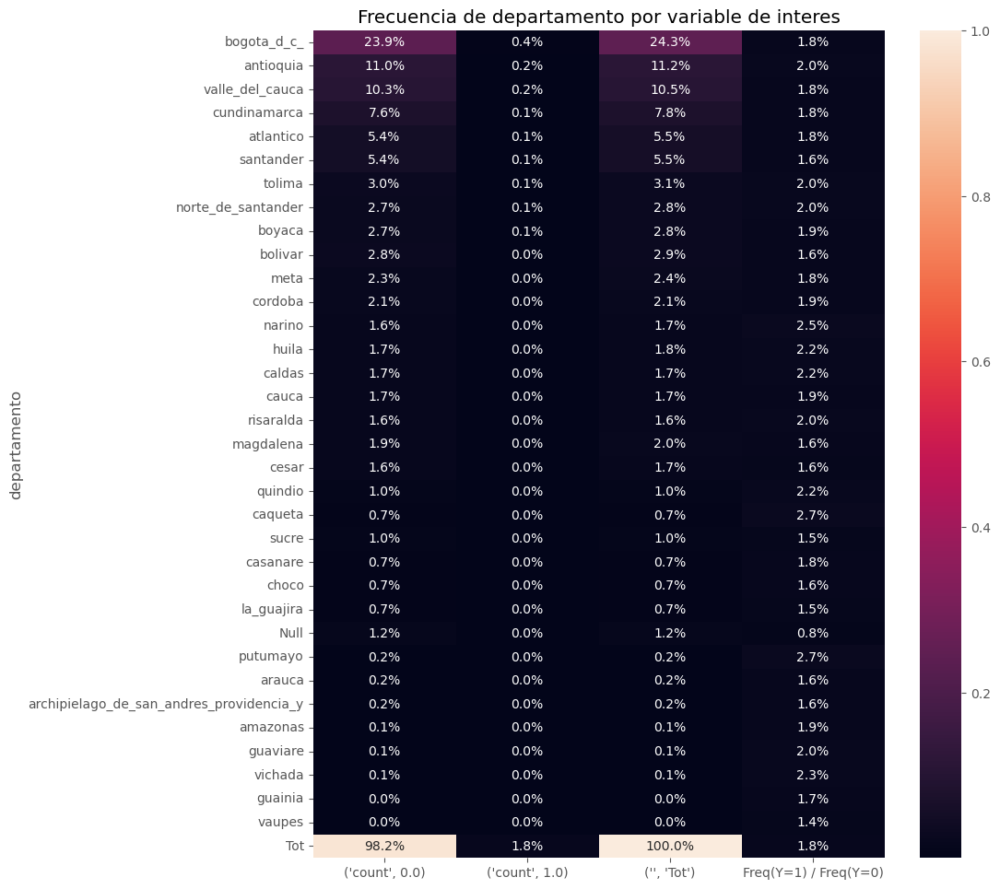

---------------------------------------------


[12/10/24 22:24:48] WARNING  /tmp/ipykernel_4764/1391706365.py:9: FutureWarning:                    ]8;id=483593;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=527476;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                                                                                                                   
                             Passing `palette` without assigning `hue` is deprecated and will be                   
                             removed in v0.14.0. Assign the `y` variable to `hue` and set                          
                             `legend=False` for the same effect.                                                   
                                                                                                                   
                               ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')                
                                                                                                                   

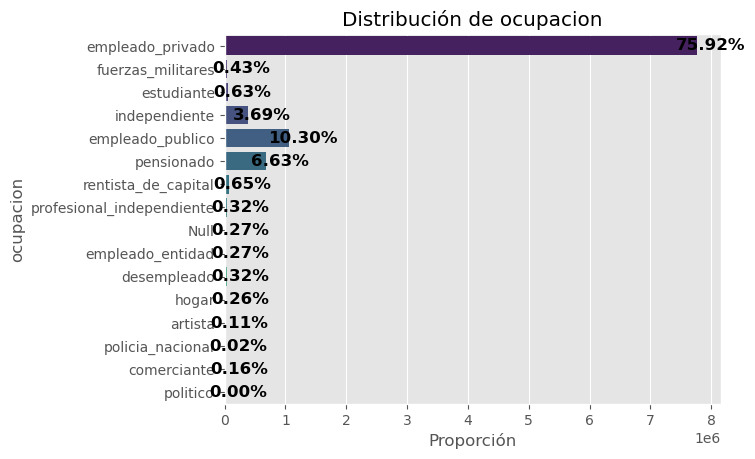

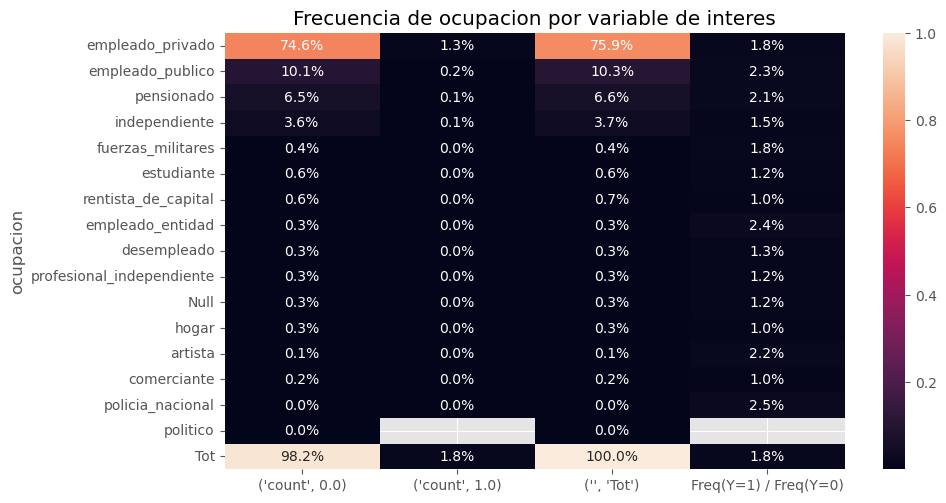

---------------------------------------------


[12/10/24 22:25:10] WARNING  /tmp/ipykernel_4764/1391706365.py:9: FutureWarning:                    ]8;id=829527;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=403519;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                                                                                                                   
                             Passing `palette` without assigning `hue` is deprecated and will be                   
                             removed in v0.14.0. Assign the `y` variable to `hue` and set                          
                             `legend=False` for the same effect.                                                   
                                                                                                                   
                               ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')                
                                                                                                                   

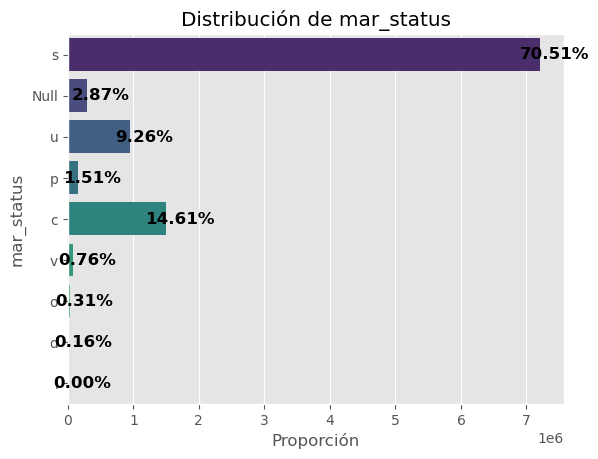

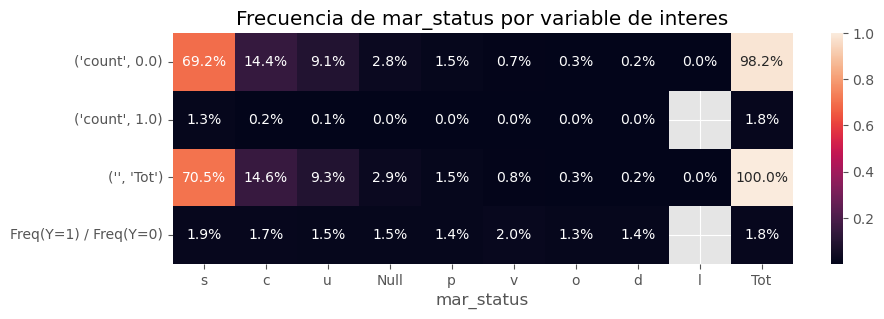

---------------------------------------------


[12/10/24 22:25:31] WARNING  /tmp/ipykernel_4764/1391706365.py:9: FutureWarning:                    ]8;id=94466;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=982556;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                                                                                                                   
                             Passing `palette` without assigning `hue` is deprecated and will be                   
                             removed in v0.14.0. Assign the `y` variable to `hue` and set                          
                             `legend=False` for the same effect.                                                   
                                                                                                                   
                               ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')                
                                                                                                                   

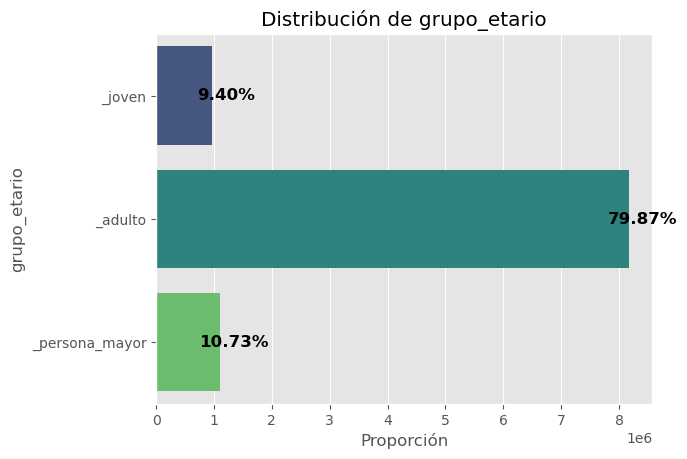

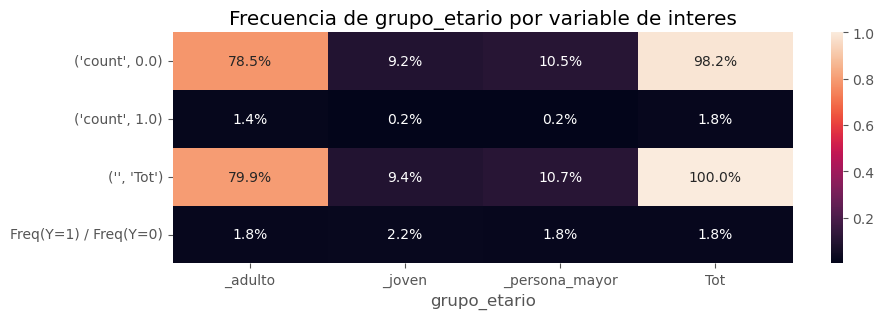

---------------------------------------------


[12/10/24 22:25:52] WARNING  /tmp/ipykernel_4764/1391706365.py:9: FutureWarning:                    ]8;id=190358;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py\warnings.py]8;;\:]8;id=308565;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/warnings.py#109\109]8;;\
                                                                                                                   
                             Passing `palette` without assigning `hue` is deprecated and will be                   
                             removed in v0.14.0. Assign the `y` variable to `hue` and set                          
                             `legend=False` for the same effect.                                                   
                                                                                                                   
                               ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')                
                                                                                                                   

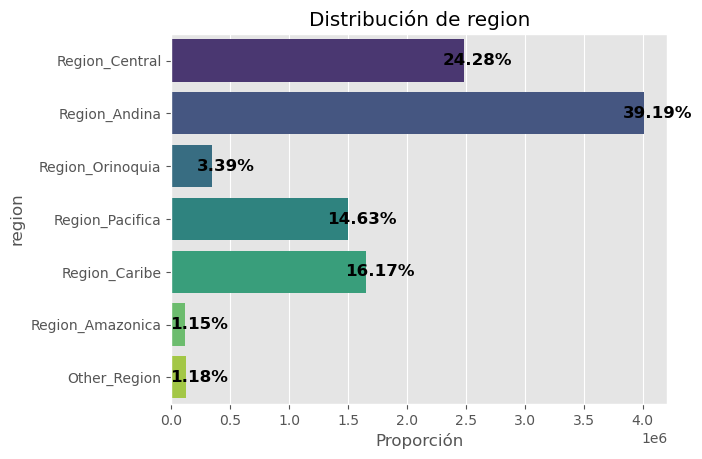

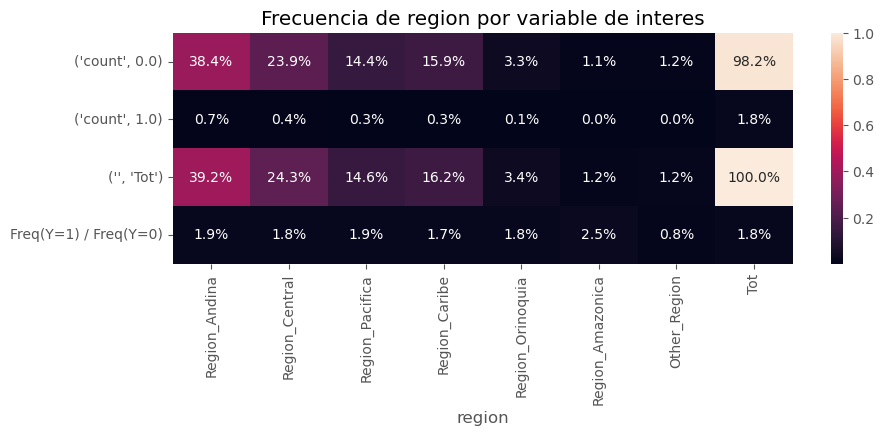

---------------------------------------------


In [82]:
df_categoricas1 = X_categorical.replace(np.nan,'Null')
y_target_plot = True
llaves_ids_unicos = []
for col in df_categoricas1:
    if col not in llaves_ids_unicos:
        # Crear el gráfico de barras usando sns.countplot
        #plt.figure(figsize=(8, 6))
        plt.style.use('ggplot')
        ax = sns.countplot(y = col, data=df_categoricas1, palette='viridis')

        # Calcular las proporciones y etiquetar las barras
        for p in ax.patches:
            width = p.get_width()  # Usamos width en vez de height porque el gráfico es horizontal
            proportion = width / df_categoricas1.shape[0]  # Calcular la proporción
            ax.annotate(f'{proportion:.2%}',  # Formato en porcentaje
                        (width, p.get_y() + p.get_height() / 2.),  # Posición de la anotación
                        ha='center', va='center',  # Alinear la anotación
                        fontsize=12, color='black', fontweight='bold', xytext=(10, 0), textcoords='offset points')
        # Etiquetas y título
        plt.ylabel(col)
        plt.xlabel('Proporción')
        plt.title(f'Distribución de {col}')

        # Mostrar el gráfico
        plt.show()
        if y_target_plot == True:
        #df_temp = pd.concat([create_feature[params['target']],df_categoricas1[col]],axis = 1)
            df_temp = df_categoricas1[[col]]
            df_temp.index = create_feature[params['target']]
            df_temp = df_temp.reset_index().set_index([params['target'], col])
            df_temp['count'] = 1
            #df_temp.unstack(level = params['target'])#..to_frame()
            df_temp1 = df_temp.groupby([params['target'], col]).sum().unstack(level = params['target'])
            df_temp1 = df_temp1.sort_values(by = ('count',1), ascending= False).T
            df_temp1['Tot'] = df_temp1.sum(axis= 1)
            df_temp1 = df_temp1.T
            df_temp1[('','Tot')] = df_temp1.sum(axis= 1)
            df_temp1 = df_temp1.T
            mdf = df_temp1.index.names
            df_temp1.index.names = ['',mdf[1]]
            n = df_temp1.loc[('','Tot'),'Tot']
            df_temp1 = df_temp1/n
            atribucion =(df_temp1.loc[('count',1)] / df_temp1.loc[('count',0)]).to_frame()
            atribucion.columns = ['Freq(Y=1) / Freq(Y=0)']
            df_temp1 = pd.concat([df_temp1,atribucion.T], axis = 0)
            if df_temp1.shape[1] >10:
                df_temp1 = df_temp1.T
                dim  = (10,df_temp1.shape[0]/3)
            else:
                dim  = (10,3)
                #plt.figure(figsize = (10,3)) 
            plt.figure(figsize = dim)
            plt.title(f'Frecuencia de {col} por variable de interes')
            sns.heatmap(df_temp1, annot = True, fmt = '0.1%')
            plt.show()
        print("---------------------------------------------")

**Variables Significativas:**

In [83]:
# importancia realizando el feature_ing categorico optimizado segun la red
best_nn = analisis_cat[analisis_cat['NN_Olden']>=cat_max_olden].groupby('variable').sum()[['NN_Olden']]
best_nn.index = ['opt_cate: '+i for i in best_nn.index]
# agregando la importancia categorica individual y la importancia de variables numericas
best_nn = pd.concat([best_nn,importance_RNN], axis = 0)
best_nn = best_nn.sort_values(by = 'NN_Olden', ascending=False).head(25)
best_nn

,NN_Olden
mes,0.678634
opt_cate: ocupacion,0.591534
periodo,0.475165
ah_cant,0.459792
ld_sum_intereses,0.414136
AAAA,0.409589
num_prod_activos,0.391311
ld_sum_pago_acumulado,0.366967
tc_cant_mora,0.350649
lib_sum_pago_mes,0.317248


In [85]:
best_logit = betas_num_sign.abs().sort_values(by = 'X1', ascending=False).head(25)
best_logit = betas_num_sign.loc[best_logit.index,['X1']]
best_logit

,X1
ratio_deuda_ingresos,1.151324e+08
ratio_deuda_ingresos_mean_3,-4.336851e+03
num_prod_activos,-5.416370e-01
ah_sum_cantidad_trx_credito,-5.343745e-01
ah_cant,-5.221669e-01
ah_sum_cantidad_trx_debito,-5.110988e-01
num_activos_prev,-5.090050e-01
ah_cant_prev,-4.903433e-01
ah_sum_monto_trx_debito_mean_2,-4.814957e-01
ah_sum_monto_trx_debito,-4.671041e-01


In [86]:
xgbotts_1 = feature.calcular_importancia(X = X_train_standard, y = y_train)
xgbotts_1 = xgbotts_1.sort_values(by = 'Importance', ascending=False).head(25)
xgbotts_1 = xgbotts_1.rename(columns = {'Feature':'variable'}).set_index('variable')
xgbotts_1

[12/10/24 22:28:28] INFO     Calculando la importancia de las características usando XGBoost...        ]8;id=484617;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py\nodes.py]8;;\:]8;id=71572;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/feature/nodes.py#265\265]8;;\

,Importance
variable,
periodo,0.178845
num_prod_activos,0.098715
ah_cant,0.033444
tc_sum_facturacion_total_valor,0.026533
ah_sum_monto_trx_debito,0.026400
tc_sum_facturacion_total_valor_mean_2,0.024610
tc_cant_mora,0.017199
ld_sum_pago_mes,0.015116
vlr_egreso_mes_std_2,0.014935


<Axes: ylabel='variable'>

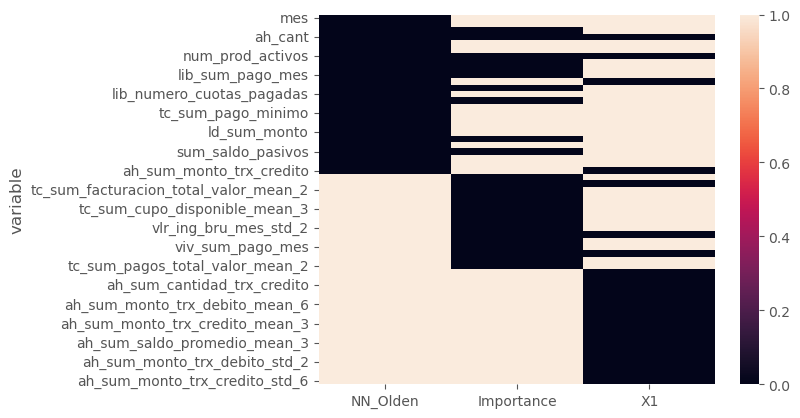

In [87]:
best_nn.index.name = 'variable'
best_logit.index.name = 'variable'
caracteres_modelos = pd.concat([best_nn,xgbotts_1,best_logit], axis = 1)
sns.heatmap(caracteres_modelos.isnull())

In [88]:
variables_filters = caracteres_modelos.index.tolist()
variables_filters


[
    'mes',
    'opt_cate: ocupacion',
    'periodo',
    'ah_cant',
    'ld_sum_intereses',
    'AAAA',
    'num_prod_activos',
    'ld_sum_pago_acumulado',
    'tc_cant_mora',
    'lib_sum_pago_mes',
    'ah_sum_cantidad_trx_debito',
    'ld_sum_pago_mes',
    'lib_numero_cuotas_pagadas',
    'ocupacion_pensionado',
    'ld_sum_saldo_corte',
    'tc_sum_pago_minimo',
    'edad_anios',
    'lib_cant',
    'ld_sum_monto',
    'ld_sum_saldo_promedio',
    'lib_sum_intereses',
    'sum_saldo_pasivos',
    'tc_sum_pagos_total_valor_mean_6',
    'ld_sum_numero_cuotas_total',
    'ah_sum_monto_trx_credito',
    'tc_sum_facturacion_total_valor',
    'ah_sum_monto_trx_debito',
    'tc_sum_facturacion_total_valor_mean_2',
    'vlr_egreso_mes_std_2',
    'grupo_etario__adulto',
    'tc_sum_cupo_disponible_mean_3',
    'otras_ord_cant',
    'ld_prom_plazo',
    'vlr_ing_bru_mes_std_2',
    'ah_sum_monto_trx_debito_mean_2',
    'ld_sum_cuota_pactada',
    'viv_sum_pago_mes',
    'ah_sum_monto_t

In [92]:
caracteres_interes_chevres = []
for col in variables_filters:
    if col not in create_feature2.columns:
        caracteres_interes_chevres.append(col)
caracteres_interes_chevres

['opt_cate: ocupacion', 'ocupacion_pensionado', 'grupo_etario__adulto']

In [94]:
create_feature2['grupo_etario'].unique()

array(['_joven', '_adulto', '_persona_mayor'], dtype=object)

In [69]:
variables_filters2 = variables_filters.copy()
for col in caracteres_interes_chevres:
    variables_filters2.remove(col)
variables_filters2


[
    'MES',
    'ah_sum_monto_trx_debito_std_3',
    'periodo',
    'ah_cant',
    'AÑO',
    'ah_sum_monto_trx_debito_std_6',
    'ah_cant_prev',
    'ah_sum_saldo_promedio_mean_6',
    'ah_sum_saldo_promedio_mean_3',
    'ah_sum_monto_trx_credito',
    'ah_sum_monto_trx_credito_std_6',
    'ah_sum_saldo_corte',
    'num_prod_activos',
    'ah_sum_saldo_promedio',
    'ah_sum_monto_trx_debito',
    'ah_sum_cantidad_trx_debito',
    'delta_ah_sum_monto_trx_debito',
    'ah_sum_monto_trx_credito_std_3',
    'otras_ord_cant_prev',
    'num_pasivos_prev',
    'sum_saldo_pasivos',
    'num_prod_pasivos',
    'viv_cant',
    'viv_cant_prev',
    'ah_sum_monto_trx_debito_mean_6',
    'ah_sum_monto_trx_debito_mean_3',
    'ah_sum_monto_trx_debito_mean_2',
    'ah_sum_monto_trx_credito_mean_2',
    'ah_sum_monto_trx_credito_mean_6',
    'ah_sum_monto_trx_credito_mean_3',
    'antiguedad_meses',
    'viv_sum_saldo_corte',
    'delta_ah_sum_monto_trx_credito',
    'viv_sum_cuota_pactada',
    

### KS ALGORITMO

In [355]:
ruta = f"/home/sagemaker-user/data-bbog-integration-fabrica-personas/notebooks/ks_result_all.csv"

In [356]:
want_run = []
#for col in variables_sign:
for col in variables_sign:
    if col in probs_dist_all.columns:
        #if col not in ks_result['X1'].unique():
            want_run.append(col)
len(want_run)

95

In [357]:
ks_result = pd.DataFrame()
t0 = time.time()
for col in variables_sign:
#for col in want_run:
    df_temp = probs_dist_all[col].to_frame()
    df_temp['decil_apertura'] = backtesting.deciles_func(np.array(df_temp[col]),10)
    df_temp.rename(columns = {col:'y_pred_proba'}, inplace = True)
    df_temp['y_real'] = create_feature2[params['target']]
    df_temp = backtesting.ks_analysis_pd(df_temp)
    df_temp = df_temp[['decil','tasa_aperturas','prob_min','prob_max']]
    df_temp.loc[:,'X1'] = col
    ks_result = pd.concat([ks_result,df_temp], axis = 0)
    ks_result.to_csv(ruta)
    print(col)
    print('-------')
t1 = time.time()

[11/22/24 02:22:54] INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=568635;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=718158;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:22:55] INFO     Cantidad de Deciles 5                                                     ]8;id=740604;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=431908;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=149527;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=763520;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=974237;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=907650;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=590260;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=861168;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

periodo
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=964110;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=506274;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:22:56] INFO     Cantidad de Deciles 3                                                     ]8;id=492749;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=787206;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=613887;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=286330;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:22:57] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=289750;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=586513;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=130840;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=323390;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

nivel_educativo
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=935009;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=169135;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:22:58] INFO     Cantidad de Deciles 3                                                     ]8;id=400373;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=597662;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=241818;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=355978;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=378328;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=910006;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=490043;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=445311;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=90325;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=451326;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

estrato
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=548850;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=459845;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:00] INFO     Cantidad de Deciles 1                                                     ]8;id=448573;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=978787;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=265795;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=910916;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=537530;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=670933;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=531947;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=295044;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=612156;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=184971;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

pqrs_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=748291;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=686780;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:01] INFO     Cantidad de Deciles 10                                                    ]8;id=479736;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=643137;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=291718;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=585585;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=836773;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=799284;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [9, 6, 5, 4]                                ]8;id=568749;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=956116;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

edad_anios
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=907541;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=804430;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:03] INFO     Cantidad de Deciles 10                                                    ]8;id=591806;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=920941;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=231932;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=958920;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=359090;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=538285;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [9, 8]                                      ]8;id=140646;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=158920;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

antiguedad_meses
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=99244;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=185184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:04] INFO     Cantidad de Deciles 10                                                    ]8;id=76786;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=237688;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=31103;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=277297;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:05] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=903910;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=644736;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [9]                                         ]8;id=854231;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=279233;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ratio_deuda_ingresos
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=162399;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=35438;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:06] INFO     Cantidad de Deciles 5                                                     ]8;id=225247;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=385758;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=111588;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=588860;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=78917;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=801969;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=886965;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=773688;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=657704;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=564709;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_credito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=347249;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=908874;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:08] INFO     Cantidad de Deciles 5                                                     ]8;id=788438;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=55546;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=1984;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=546117;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=160913;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=280363;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=36875;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=409032;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=316767;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=505842;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_debito
-------


[11/22/24 02:23:09] INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=633673;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=615809;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:10] INFO     Cantidad de Deciles 9                                                     ]8;id=877270;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=465099;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=695866;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=846788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:11] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=516424;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=651082;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [8, 7]                                      ]8;id=338848;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=991225;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=32143;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=70872;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:12] INFO     Cantidad de Deciles 5                                                     ]8;id=432280;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=96226;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=391897;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=414258;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=842680;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=151913;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=32556;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=606401;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=225995;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=218483;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_cantidad_trx_credito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=751577;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=890443;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:14] INFO     Cantidad de Deciles 5                                                     ]8;id=790527;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=49437;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=676966;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=15400;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=574763;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=206978;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=36642;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=749524;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=602212;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=219971;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_cantidad_trx_debito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=619360;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=61490;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:15] INFO     Cantidad de Deciles 3                                                     ]8;id=776640;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=272423;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=873912;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=912678;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:16] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=13024;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=240496;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=50661;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=934775;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_sum_facturacion_total_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=58275;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=733279;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:17] INFO     Cantidad de Deciles 3                                                     ]8;id=321411;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=706795;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=18461;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=325959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=401805;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=699670;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=524747;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=843208;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_sum_facturacion_total_valor
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=126964;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=156571;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:18] INFO     Cantidad de Deciles 1                                                     ]8;id=229043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=959601;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=440967;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=269755;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:19] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=948913;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=739065;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=247579;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=248674;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=73377;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=924423;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cc_sum_monto_trx_credito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=957186;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=663835;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:20] INFO     Cantidad de Deciles 1                                                     ]8;id=506734;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=41341;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=735415;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=357838;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=748483;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=938231;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=123847;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=220330;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=156781;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=8976;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cc_sum_monto_trx_debito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=932495;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=120766;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:21] INFO     Cantidad de Deciles 2                                                     ]8;id=357957;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=104658;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=231419;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=143004;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:22] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=567162;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=686148;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=1680;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=606450;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=981439;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=540112;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cc_sum_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=455468;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=725286;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:23] INFO     Cantidad de Deciles 1                                                     ]8;id=522167;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=507187;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=774555;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=830793;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=958986;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=510064;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=591256;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=277315;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=396489;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=840894;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

fac_sum_cuota_pactada
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=874075;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=99369;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:24] INFO     Cantidad de Deciles 3                                                     ]8;id=709501;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=749420;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=161008;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=17187;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:25] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=389041;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=229714;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=927340;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=930134;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

lib_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=143138;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=293728;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:26] INFO     Cantidad de Deciles 3                                                     ]8;id=900922;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=5332;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=156859;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=388772;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=71675;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=444679;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=529250;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=716158;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=638733;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=330721;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

lib_sum_cuota_pactada
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=59429;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=613805;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:27] INFO     Cantidad de Deciles 1                                                     ]8;id=541413;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=747586;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=596484;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=549676;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:28] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=887600;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=564985;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=542650;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=55139;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=931874;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=856338;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sus_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=50897;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=590458;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:29] INFO     Cantidad de Deciles 1                                                     ]8;id=318138;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=42354;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=177735;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=904568;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=712460;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=744030;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=477424;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=441537;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=901705;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=587615;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sus_sum_cuota_pactada
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=745249;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=504526;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:30] INFO     Cantidad de Deciles 1                                                     ]8;id=495657;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=228552;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=402213;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=729043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:31] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=489800;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=188533;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=126401;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=967057;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=650907;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=780580;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

veh_sum_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=997206;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=385835;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:32] INFO     Cantidad de Deciles 2                                                     ]8;id=895872;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=47813;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=876476;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=238851;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=397227;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=564771;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=612453;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=787853;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=403510;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=979800;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

veh_sum_cuota_pactada
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=493217;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=834480;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:33] INFO     Cantidad de Deciles 1                                                     ]8;id=618362;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=274715;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=596358;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=823062;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:34] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=733534;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=720575;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=979985;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=379511;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=124540;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=740841;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

viv_sum_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=994019;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=226375;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:35] INFO     Cantidad de Deciles 1                                                     ]8;id=180985;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=23207;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=52632;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=440636;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=958867;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=883335;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=959959;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=814194;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=71927;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=993607;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

viv_sum_cuota_pactada
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=632436;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=55010;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:36] INFO     Cantidad de Deciles 1                                                     ]8;id=510662;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=957673;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=284775;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=730125;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:23:37] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=37554;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=539700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=329191;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=1110;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=749818;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=692904;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

finesa_sum_saldo_corte
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=370270;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=47747;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:38] INFO     Cantidad de Deciles 1                                                     ]8;id=266190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=925805;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=634957;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=803963;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=284955;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=468890;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=237863;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=219310;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=395885;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=377569;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

finesa_sum_cuota_pactada
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=69807;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=230375;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:40] INFO     Cantidad de Deciles 5                                                     ]8;id=318236;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=890450;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=130255;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=542230;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=316826;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=344885;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=170200;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=754376;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=307680;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=577053;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_credito_mean_3
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=431825;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=287241;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:42] INFO     Cantidad de Deciles 5                                                     ]8;id=514476;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=883865;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=527073;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=625214;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=5005;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=546214;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=465750;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=737171;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=380176;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=538575;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_credito_std_3
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=122122;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=728115;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:44] INFO     Cantidad de Deciles 5                                                     ]8;id=579290;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=145376;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=535431;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=819912;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=545641;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=792077;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=897427;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=717464;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=506652;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=633224;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_debito_mean_3
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=666040;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=857697;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:46] INFO     Cantidad de Deciles 5                                                     ]8;id=369687;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=840767;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=667737;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=366882;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=119723;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=357361;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=449003;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=303175;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=742271;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=45190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_debito_std_3
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=688539;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=817498;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:48] INFO     Cantidad de Deciles 9                                                     ]8;id=769388;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=644393;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

[11/22/24 02:23:49] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=688328;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=204619;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=977596;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=348506;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [8, 7, 6, 5]                                ]8;id=235012;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=966043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_saldo_promedio_mean_3
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=451180;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=347379;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:50] INFO     Cantidad de Deciles 5                                                     ]8;id=686297;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=506849;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

[11/22/24 02:23:51] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=960671;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=741420;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=167681;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=832631;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=593540;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=878111;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=361848;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=485628;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_credito_mean_6
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=151753;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=859333;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:53] INFO     Cantidad de Deciles 5                                                     ]8;id=75496;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=708625;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=635079;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=16482;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=275645;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=184947;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=827492;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=771688;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=494116;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=620845;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_credito_std_6
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=269300;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=404889;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:55] INFO     Cantidad de Deciles 6                                                     ]8;id=960276;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=664382;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=506158;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=480961;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=980737;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=475373;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=324408;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=418185;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=542118;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=443517;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_debito_mean_6
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=850935;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=995613;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:57] INFO     Cantidad de Deciles 6                                                     ]8;id=459353;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=782952;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=131816;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=204896;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=919780;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=880657;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=380393;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=600155;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=279384;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=293895;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_debito_std_6
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=55877;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=277656;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:23:59] INFO     Cantidad de Deciles 9                                                     ]8;id=880788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=434355;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=741657;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=157344;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:00] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=555104;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=326712;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [8, 7, 6]                                   ]8;id=62122;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=727344;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_saldo_promedio_mean_6
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=412683;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=513465;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:01] INFO     Cantidad de Deciles 2                                                     ]8;id=530432;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=540913;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=782245;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=14017;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=576520;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=28836;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=489182;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=700974;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=60934;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=834737;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=192477;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=73202;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:03] INFO     Cantidad de Deciles 2                                                     ]8;id=497731;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=702489;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=34305;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=616892;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=34929;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=228044;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=421046;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=35146;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=763945;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=55970;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=551828;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=387893;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:04] INFO     Cantidad de Deciles 1                                                     ]8;id=630536;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=686810;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=100135;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=146494;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=263654;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=473599;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=917256;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=386234;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=595954;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=497991;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cdt_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=573187;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=110734;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:05] INFO     Cantidad de Deciles 1                                                     ]8;id=308465;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=505600;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

[11/22/24 02:24:06] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=80938;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=64572;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=10789;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=179798;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=896985;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=483250;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=403770;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=385460;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cdt_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=774876;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=258151;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:07] INFO     Cantidad de Deciles 2                                                     ]8;id=117201;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=668588;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=341334;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=597744;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=521666;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=221525;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=893238;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=87950;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=434792;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=955959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=666617;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=841218;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:09] INFO     Cantidad de Deciles 2                                                     ]8;id=657409;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=411073;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=868012;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=250265;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=985589;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=684930;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=369308;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=152777;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=642892;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=706937;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=63257;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=195978;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:10] INFO     Cantidad de Deciles 1                                                     ]8;id=272314;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=358817;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=60436;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=736063;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=832355;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=961318;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=542226;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=27659;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=703943;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=407722;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cc_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=538272;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=728986;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:11] INFO     Cantidad de Deciles 1                                                     ]8;id=903836;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=122918;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=106164;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=310431;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:12] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=51652;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=331635;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=679225;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=771882;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=467217;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=477737;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cc_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=634020;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=78822;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:13] INFO     Cantidad de Deciles 1                                                     ]8;id=363571;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=165403;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=496315;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=162662;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=928932;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=693143;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=637571;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=348630;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=555490;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=994907;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

fid_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=384779;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=824390;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:14] INFO     Cantidad de Deciles 1                                                     ]8;id=725478;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=377184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=445855;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=981288;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:15] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=785200;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=983174;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=295879;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=46196;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=832621;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=749405;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

fid_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=942125;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=690291;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:16] INFO     Cantidad de Deciles 1                                                     ]8;id=890228;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=641803;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=37717;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=110138;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=870736;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=585968;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=747498;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=506936;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=638001;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=519773;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cs_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=326239;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=140259;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:17] INFO     Cantidad de Deciles 1                                                     ]8;id=820578;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=733440;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=914829;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=690118;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:18] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=503603;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=969633;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=962703;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=157043;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=113083;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=501476;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cs_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=868856;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=922383;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:19] INFO     Cantidad de Deciles 1                                                     ]8;id=50122;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=670790;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=679233;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=980036;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=764835;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=694902;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=848099;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=583134;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=357027;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=234114;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

fac_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=115355;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=381959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:20] INFO     Cantidad de Deciles 1                                                     ]8;id=289184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=34120;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=784388;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=279838;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:21] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=700681;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=458940;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=713669;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=949084;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=434357;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=150598;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

fac_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=391172;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=802425;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:22] INFO     Cantidad de Deciles 1                                                     ]8;id=339527;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=657068;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=206485;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=722277;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=775240;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=212873;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=31867;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=13739;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=758599;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=545974;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

lib_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=189450;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=59948;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:23] INFO     Cantidad de Deciles 1                                                     ]8;id=205366;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=687678;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=27572;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=662118;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:24] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=199545;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=939249;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=386312;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=259787;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=268969;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=807810;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

lib_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=476974;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=819342;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:25] INFO     Cantidad de Deciles 1                                                     ]8;id=990152;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=579489;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=799224;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=56609;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=199156;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=995270;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=568310;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=310986;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=949957;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=135723;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sus_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=971849;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=676874;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:26] INFO     Cantidad de Deciles 1                                                     ]8;id=855321;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=812328;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=18643;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=889696;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:27] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=355703;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=583399;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=345924;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=849667;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=920941;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=305039;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sus_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=124290;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=795685;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:28] INFO     Cantidad de Deciles 1                                                     ]8;id=925540;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=259024;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=543373;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=292246;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=422979;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=237720;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=218765;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=294043;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=568545;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=733587;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

veh_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=390453;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=858714;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:29] INFO     Cantidad de Deciles 1                                                     ]8;id=628061;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=327789;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=475348;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=511864;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=899166;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=456616;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=60824;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=205775;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=402290;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=243953;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

veh_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=374673;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=438949;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:31] INFO     Cantidad de Deciles 1                                                     ]8;id=24365;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=862624;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=701461;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=839959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=235333;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=121585;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=836889;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=411524;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=471248;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=408875;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

viv_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=431541;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=645870;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:32] INFO     Cantidad de Deciles 1                                                     ]8;id=514378;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=714331;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=215523;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=676187;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=778359;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=573015;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=283359;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=546038;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=766950;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=731178;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

viv_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=292424;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=78120;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:33] INFO     Cantidad de Deciles 1                                                     ]8;id=421283;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=25078;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

[11/22/24 02:24:34] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=575589;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=384068;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=102991;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=573429;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=200861;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=341111;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=506363;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=319015;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ord_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=98541;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=228331;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:35] INFO     Cantidad de Deciles 1                                                     ]8;id=258043;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=751063;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=660093;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=813437;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=729078;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=602642;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=573385;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=733524;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=456986;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=427719;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ord_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=849207;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=97249;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:37] INFO     Cantidad de Deciles 2                                                     ]8;id=230801;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=355907;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=424668;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=103872;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=688682;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=3441;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=739505;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=350774;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=214333;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=935442;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

otras_ord_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=555590;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=963445;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:38] INFO     Cantidad de Deciles 2                                                     ]8;id=996635;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=963357;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=762365;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=359532;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:39] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=229403;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=179878;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=271720;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=21002;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=635040;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=716743;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

otras_ord_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=224215;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=994654;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:40] INFO     Cantidad de Deciles 1                                                     ]8;id=942581;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=927352;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=286915;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=346133;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=672822;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=711989;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=691263;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=20243;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=471286;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=570520;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

finesa_cant
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=803591;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=763008;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:41] INFO     Cantidad de Deciles 1                                                     ]8;id=234464;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=475068;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=900255;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=31752;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=582065;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=360946;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=732617;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=192037;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=334959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=419057;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

finesa_cant_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=230229;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=737832;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:43] INFO     Cantidad de Deciles 9                                                     ]8;id=183649;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=315916;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=314025;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=326823;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:44] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=108187;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=321769;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [8, 7, 6, 5]                                ]8;id=909726;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=590856;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=559700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=780556;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:45] INFO     Cantidad de Deciles 1                                                     ]8;id=397667;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=598067;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=251350;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=852598;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=114382;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=163041;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=770904;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=789626;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=934632;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=640622;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cc_sum_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=16112;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=819630;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:46] INFO     Cantidad de Deciles 7781935                                               ]8;id=388759;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=388481;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=384190;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=128059;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:47] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=142606;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=577023;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [6.0, 5.0, 4.0]                             ]8;id=933165;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=583421;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cdt_sum_monto_apertura
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=486318;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=522485;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:48] INFO     Cantidad de Deciles 1                                                     ]8;id=982797;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=687734;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=303757;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=989976;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=281367;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=757787;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=326850;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=553045;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=133753;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=603128;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

cdt_sum_valor_interes
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=839133;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=410874;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:50] INFO     Cantidad de Deciles 6                                                     ]8;id=969800;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=312163;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=971029;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=525099;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=919776;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=40555;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [5, 4, 3]                                   ]8;id=614317;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=387347;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_sum_saldo_mean_2
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=788302;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=288481;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:52] INFO     Cantidad de Deciles 4                                                     ]8;id=866082;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=670916;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=887803;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=475703;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=44189;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=156192;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [3]                                         ]8;id=700695;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=553763;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ld_sum_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=565217;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=120700;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:53] INFO     Cantidad de Deciles 3                                                     ]8;id=471103;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=442539;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=833550;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=475508;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:54] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=981032;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=123151;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=577095;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=587539;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

lib_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=478744;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=917103;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:55] INFO     Cantidad de Deciles 1                                                     ]8;id=805951;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=765374;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=969870;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=657930;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=458194;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=254818;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=53191;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=633574;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=259866;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=236722;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sus_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=483918;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=360262;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:56] INFO     Cantidad de Deciles 1                                                     ]8;id=926030;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=566182;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=504084;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=714451;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:24:57] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=443886;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=98480;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=109466;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=904579;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=464745;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=961549;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

veh_sum_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=339556;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=146487;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:24:58] INFO     Cantidad de Deciles 1                                                     ]8;id=651739;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=342267;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=169439;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=665618;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=167140;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=243080;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=420535;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=188841;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=193172;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=231471;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

viv_sum_saldo_promedio
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=636992;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=653972;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:00] INFO     Cantidad de Deciles 5                                                     ]8;id=130982;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=513088;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=676565;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=352350;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=333031;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=80142;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=614005;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=81693;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=915241;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=769709;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_credito_mean_2
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=868863;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=403938;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:02] INFO     Cantidad de Deciles 5                                                     ]8;id=231658;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=473433;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=336079;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=182184;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=376021;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=103606;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=712079;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=273461;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=871338;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=551915;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ah_sum_monto_trx_debito_mean_2
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=439473;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=484733;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:04] INFO     Cantidad de Deciles 3                                                     ]8;id=622842;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=538501;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=736198;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=824407;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=373679;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=484636;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=429415;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=544168;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=754269;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=658245;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_sum_facturacion_total_valor_mean_2
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=959150;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=995245;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:05] INFO     Cantidad de Deciles 3                                                     ]8;id=463648;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=266104;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=588716;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=392710;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:25:06] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=970263;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=879483;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=623100;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=444622;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=346022;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=978733;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

tc_sum_facturacion_total_valor_mean_6
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=94745;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=285543;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:07] INFO     Cantidad de Deciles 10                                                    ]8;id=111096;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=432106;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=472402;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=499041;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=354710;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=491508;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [9, 8, 7, 6, 5]                             ]8;id=622306;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=9867;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

vlr_ing_bru_mes
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=601607;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=541291;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:08] INFO     Cantidad de Deciles 1                                                     ]8;id=4627;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=527052;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=567383;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=582714;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:25:09] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=818976;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=315202;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=798542;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=585345;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=957117;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=901087;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

AÑO
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=545922;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=980972;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:10] INFO     Cantidad de Deciles 5                                                     ]8;id=241449;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=588738;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=664736;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=338146;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=290410;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=675413;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [3, 2]                                      ]8;id=138621;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=324415;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

MES
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=400101;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=405080;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:11] INFO     Cantidad de Deciles 7781935                                               ]8;id=719744;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=390130;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=35997;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=412257;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:25:12] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=623494;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=750557;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [9.0, 8.0, 7.0, 6.0]                        ]8;id=215153;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=968604;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sum_saldo_activos
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=830321;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=413819;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:14] INFO     Cantidad de Deciles 9                                                     ]8;id=314716;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=159701;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=442550;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=588859;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=776492;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=795325;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [8, 5, 4, 3, 2]                             ]8;id=904990;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=174465;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

sum_saldo_pasivos
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=536062;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=373411;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:16] INFO     Cantidad de Deciles 5                                                     ]8;id=428316;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=73431;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=271145;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=272082;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=373520;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=331754;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [4]                                         ]8;id=859306;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=180019;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

delta_ah_sum_monto_trx_credito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=384414;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=281997;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:18] INFO     Cantidad de Deciles 6                                                     ]8;id=882488;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=487580;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=256242;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=344806;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=156894;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=850673;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [5, 4, 3]                                   ]8;id=869728;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=322813;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

delta_ah_sum_monto_trx_debito
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=799324;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=809803;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:20] INFO     Cantidad de Deciles 4                                                     ]8;id=972578;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=422000;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=25186;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=424283;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=897317;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=32392;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [2]                                         ]8;id=524390;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=65380;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

delta_tc_sum_facturacion_total
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=204055;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=791548;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:21] INFO     Cantidad de Deciles 2                                                     ]8;id=248855;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=364021;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=203008;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=148368;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=85791;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=888754;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=720484;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=344533;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=964141;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=859582;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

num_activos_prev
-------


[11/22/24 02:25:22] INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=812590;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=751628;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:23] INFO     Cantidad de Deciles 2                                                     ]8;id=133248;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=252016;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=980254;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=242472;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=344009;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=907413;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=115012;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=90745;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=241708;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=420085;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

num_pasivos_prev
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=827066;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=432903;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:24] INFO     Cantidad de Deciles 2                                                     ]8;id=767995;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=370358;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=465688;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=158169;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

[11/22/24 02:25:25] INFO     Calculando el estadístico KS para cada decil...                           ]8;id=315606;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=356103;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=581665;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=315019;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=800098;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=974446;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

num_prod_activos
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=91075;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=436124;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:26] INFO     Cantidad de Deciles 2                                                     ]8;id=367352;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=805788;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=681717;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=823046;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=157420;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=386718;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=904983;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=439479;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=319311;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=131130;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

num_prod_pasivos
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=190645;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=416273;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:27] INFO     Cantidad de Deciles 3                                                     ]8;id=709343;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=523369;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

[11/22/24 02:25:28] INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=809034;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=647652;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=718394;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=83606;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    WARNING  /home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_b ]8;id=476195;file:///opt/conda/lib/python3.11/warnings.py\warnings.py]8;;\:]8;id=247369;file:///opt/conda/lib/python3.11/warnings.py#110\110]8;;\
                             bog_integration_fabrica_personas/pipelines/backtesting/nodes.py:703:                  
                             FutureWarning: Downcasting behavior in `replace` is deprecated and                    
                             will be removed in a future version. To retain the old behavior,                      
                             explicitly call `result.infer_objects(copy=False)`. To opt-in to the                  
                             future behavior, set `pd.set_option('future.no_silent_downcasting',                   
                             True)`                                                                                
                               decil_congruente = (grouped.set_index('decil')['ks_stat'].diff() >                  
                             0).replace(False,np.nan).dropna().index                                               
                                                                                                                   

                    INFO     Deciles donde el ks aumenta:  []                                          ]8;id=482323;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=205965;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

mar_status
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=651027;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=333779;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:29] INFO     Cantidad de Deciles 4                                                     ]8;id=800962;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=451544;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=680659;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=874580;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=255178;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=86764;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [3]                                         ]8;id=993099;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=344013;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

ocupacion
-------


                    INFO     Calculando deciles a partir de las probabilidades predichas...            ]8;id=275867;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=629593;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#195\195]8;;\

[11/22/24 02:25:31] INFO     Cantidad de Deciles 5                                                     ]8;id=394463;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=426808;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#225\225]8;;\

                    INFO     Iniciando análisis KS por deciles de probabilidad...                      ]8;id=434740;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=969463;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#642\642]8;;\

                    INFO     Calculando el estadístico KS para cada decil...                           ]8;id=270052;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=972307;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#680\680]8;;\

                    INFO     Deciles donde el ks aumenta:  [4, 3]                                      ]8;id=783959;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py\nodes.py]8;;\:]8;id=848718;file:///home/sagemaker-user/data-bbog-integration-fabrica-personas/src/data_bbog_integration_fabrica_personas/pipelines/backtesting/nodes.py#704\704]8;;\

region
-------


In [354]:
print((t1-t0)/60) # modelo viejo

1.1382315317789713


In [70]:
ruta = f"/home/sagemaker-user/data-bbog-integration-fabrica-personas/notebooks/ks_result_all.csv"
ruta1 = f"/home/sagemaker-user/data-bbog-integration-fabrica-personas/notebooks/ks_result.csv"

import pandas as pd
import numpy as np
import plotly.graph_objects as go

Cantidad de variables: (95,)
Col: [('tasa_aperturas', 10.0), ('tasa_aperturas', 20.0), ('tasa_aperturas', 30.0), ('tasa_aperturas', 40.0), ('tasa_aperturas', 50.0)]
Col: [10.0, 20.0, 30.0, 40.0, 50.0]
(10,)
(10,)
(10, 10)
(10, 10)
(10, 10)


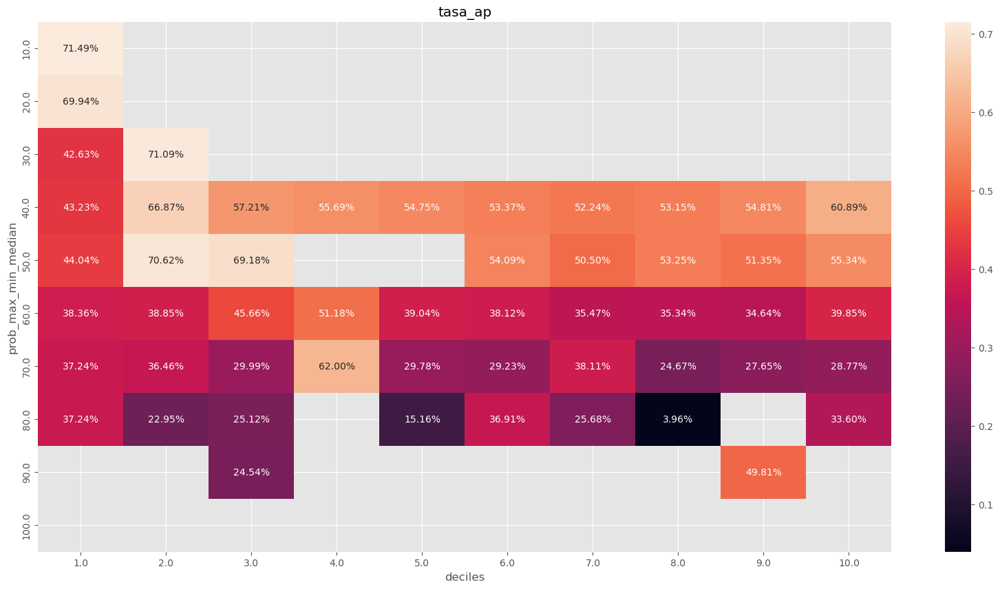

Cantidad de variables: (37,)
Col: [('tasa_aperturas', 10.0), ('tasa_aperturas', 20.0), ('tasa_aperturas', 30.0), ('tasa_aperturas', 40.0), ('tasa_aperturas', 50.0)]
Col: [10.0, 20.0, 30.0, 40.0, 50.0]
(10,)
(9,)
(9, 10)
(9, 10)
(9, 10)


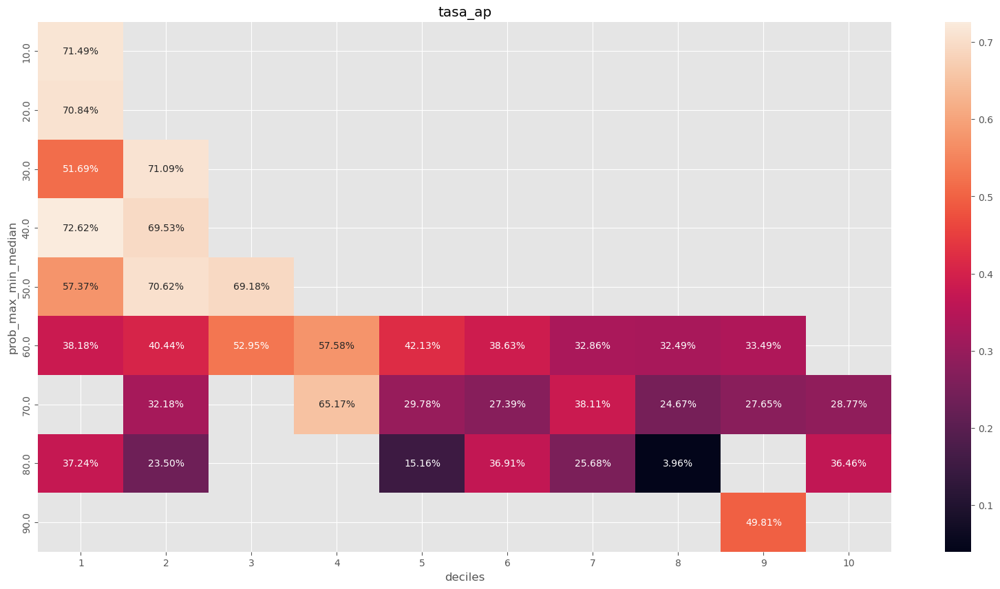

In [71]:
msj = ['all data','Selected']
for pos,rut in enumerate([ruta,ruta1]):
    ks_result = pd.read_csv(rut).set_index('Unnamed: 0')
    print('Cantidad de variables:',ks_result['X1'].unique().shape)
    
    ks_result['prob_plot'] = (ks_result[['prob_min','prob_max']].median(axis = 1)).round(0)
    ks_result['prob_plot'] = (ks_result[['prob_min','prob_max']].median(axis = 1)/10).round(0)*10
    
    try:
        plot_3d = ks_result.set_index(['prob_plot','decil'])[['tasa_aperturas']].unstack(level = 'prob_plot')
    except:
        plot_3d = ks_result.groupby(['prob_plot','decil'])[['tasa_aperturas']].mean().unstack(level = 'prob_plot')
    col_names = plot_3d.columns.get_level_values(1)
    print('Col:',plot_3d.columns[:5].tolist())
    plot_3d.columns = col_names
    print('Col:',plot_3d.columns[:5].tolist())
    
    x = plot_3d.index 
    x_label = 'deciles'
    y = plot_3d.columns
    y_label = 'prob_max_min_median'
    print(x.shape)
    print(y.shape)
    x, y = np.meshgrid(x, y) # Crear una malla de coordenadas
    print(x.shape)
    print(y.shape)
    z = plot_3d.T.fillna(0).values # Función para z
    z_label = 'tasa_ap'
    print(z.shape)
    plt.figure(figsize = (20,10))
    plt.title(z_label)
    sns.heatmap((plot_3d/100).T, annot = True, fmt = '0.02%')
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.show()
    
    # Crear la superficie 3D con Plotly
    fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
    
    # Añadir etiquetas y título
    fig.update_layout(
        title='Prob Median, Deciles & Propension '+msj[pos],
        scene=dict(
            xaxis_title=x_label,
            yaxis_title=y_label,
            zaxis_title=z_label
        )
    )
    # Mostrar el gráfico interactivo
    fig.show()
    plt.show()

Cantidad de variables: (95,)
Col: [('tasa_aperturas', 20.0), ('tasa_aperturas', 30.0), ('tasa_aperturas', 40.0), ('tasa_aperturas', 50.0), ('tasa_aperturas', 60.0)]
Col: [20.0, 30.0, 40.0, 50.0, 60.0]
(10,)
(9,)
(9, 10)
(9, 10)
(9, 10)


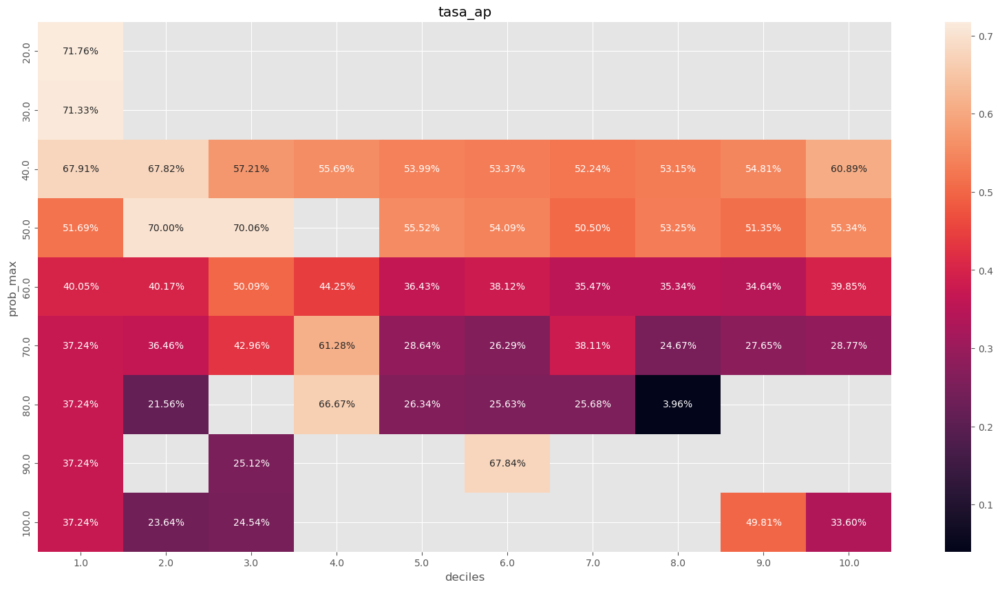

Cantidad de variables: (37,)
Col: [('tasa_aperturas', 20.0), ('tasa_aperturas', 30.0), ('tasa_aperturas', 40.0), ('tasa_aperturas', 50.0), ('tasa_aperturas', 60.0)]
Col: [20.0, 30.0, 40.0, 50.0, 60.0]
(10,)
(9,)
(9, 10)
(9, 10)
(9, 10)


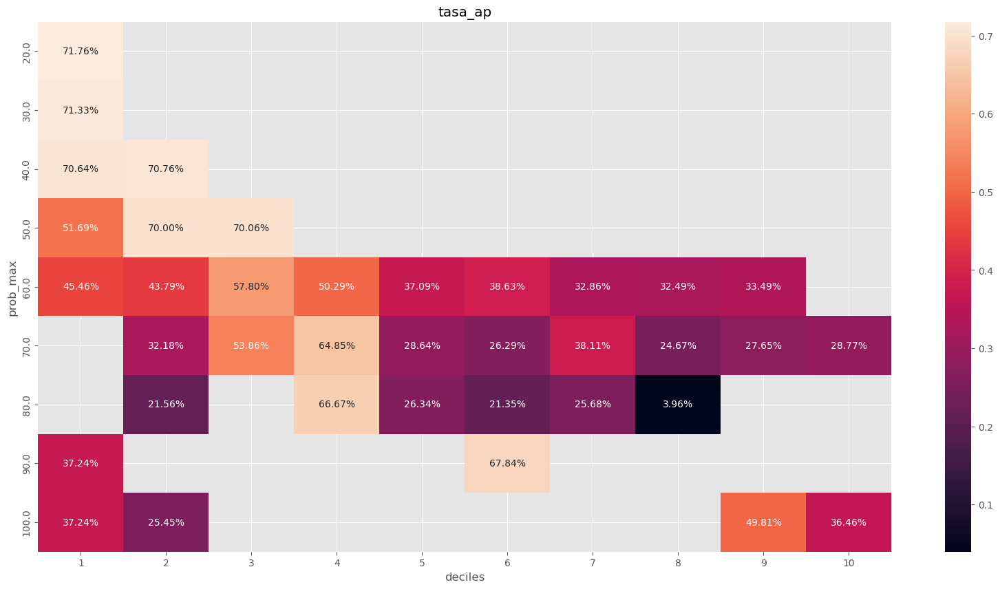

In [72]:
msj = ['all data','Selected']
for pos,rut in enumerate([ruta,ruta1]):
    ks_result = pd.read_csv(rut).set_index('Unnamed: 0')
    print('Cantidad de variables:',ks_result['X1'].unique().shape)
    ks_result['prob_plot'] = (ks_result['prob_max']).round(0)
    ks_result['prob_plot'] = (ks_result['prob_max']/10).round(0)*10
    try:
        plot_3d = ks_result.set_index(['prob_plot','decil'])[['tasa_aperturas']].unstack(level = 'prob_plot')
    except:
        plot_3d = ks_result.groupby(['prob_plot','decil'])[['tasa_aperturas']].mean().unstack(level = 'prob_plot')
    col_names = plot_3d.columns.get_level_values(1)
    print('Col:',plot_3d.columns[:5].tolist())
    plot_3d.columns = col_names
    print('Col:',plot_3d.columns[:5].tolist())
    
    x = plot_3d.index 
    x_label = 'deciles'
    y = plot_3d.columns
    y_label = 'prob_max'
    print(x.shape)
    print(y.shape)
    x, y = np.meshgrid(x, y) # Crear una malla de coordenadas
    print(x.shape)
    print(y.shape)
    z = plot_3d.T.fillna(0).values # Función para z
    z_label = 'tasa_ap'
    print(z.shape)
    plt.figure(figsize = (20,10))
    plt.title(z_label)
    sns.heatmap((plot_3d/100).T, annot = True, fmt = '0.02%')
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.show()
    
    # Crear la superficie 3D con Plotly
    fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
    
    # Añadir etiquetas y título
    fig.update_layout(
        title='Prob Max, Deciles & Propension '+msj[pos],
        scene=dict(
            xaxis_title=x_label,
            yaxis_title=y_label,
            zaxis_title=z_label
        )
    )
    # Mostrar el gráfico interactivo
    fig.show()
    plt.show()

Cantidad de variables: (95,)


,0,1,2,3,4,5,6,7,8,9,...,85,86,87,88,89,90,91,92,93,94
name,AÑO,MES,ah_cant,ah_cant_prev,ah_sum_cantidad_trx_credito,ah_sum_cantidad_trx_debito,ah_sum_monto_trx_credito,ah_sum_monto_trx_credito_mean_2,ah_sum_monto_trx_credito_mean_3,ah_sum_monto_trx_credito_mean_6,...,veh_cant_prev,veh_sum_cuota_pactada,veh_sum_saldo_corte,veh_sum_saldo_promedio,viv_cant,viv_cant_prev,viv_sum_cuota_pactada,viv_sum_saldo_corte,viv_sum_saldo_promedio,vlr_ing_bru_mes
code,0,1,2,3,4,5,6,7,8,9,...,85,86,87,88,89,90,91,92,93,94


(95,)
(10,)
(10, 95)
(10, 95)
(10, 95)


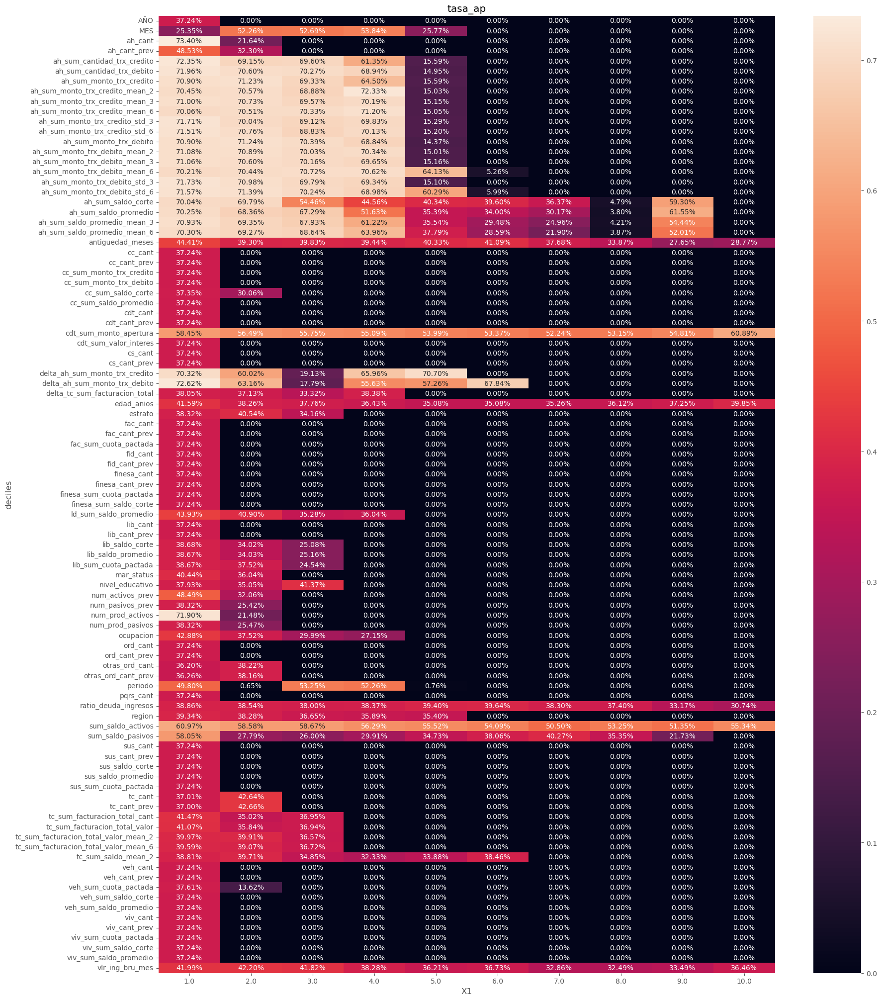

Cantidad de variables: (37,)


,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
name,AÑO,MES,ah_cant,ah_cant_prev,ah_sum_cantidad_trx_credito,ah_sum_cantidad_trx_debito,ah_sum_monto_trx_credito,ah_sum_monto_trx_credito_mean_2,ah_sum_monto_trx_credito_mean_3,ah_sum_monto_trx_credito_mean_6,...,num_prod_activos,num_prod_pasivos,otras_ord_cant_prev,periodo,sum_saldo_pasivos,viv_cant,viv_cant_prev,viv_sum_cuota_pactada,viv_sum_saldo_corte,vlr_ing_bru_mes
code,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36


(37,)
(10,)
(10, 37)
(10, 37)
(10, 37)


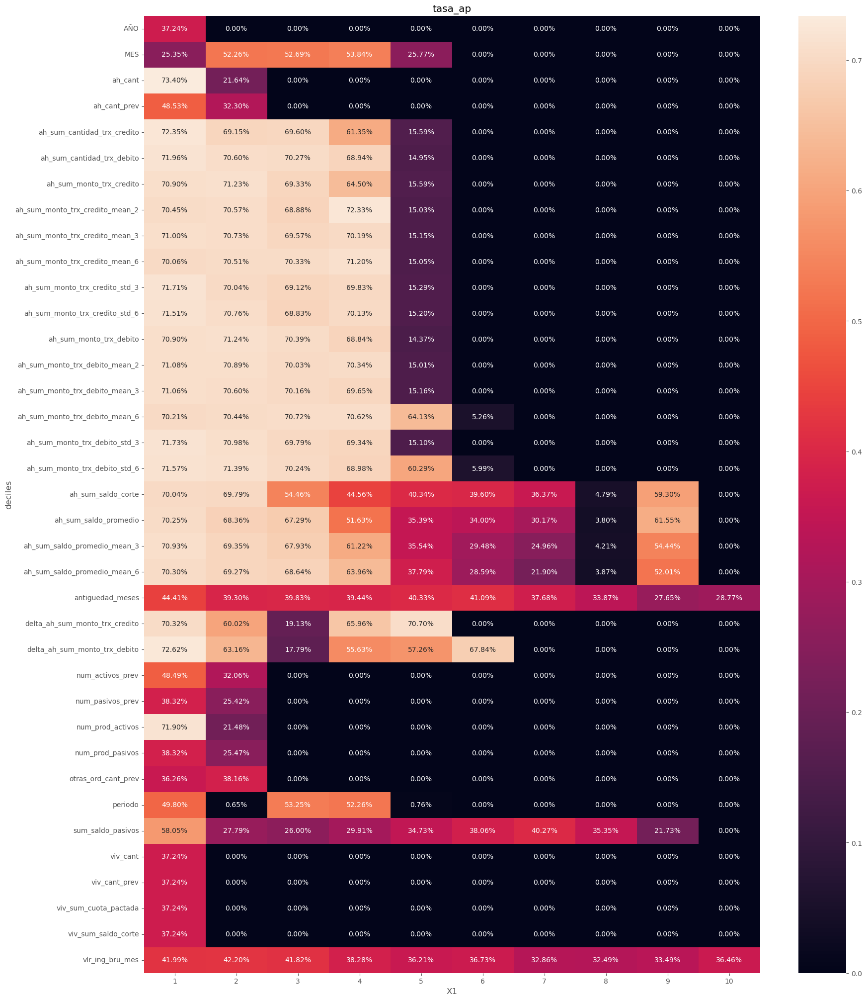

In [73]:
msj = ['all data','Selected']
for pos,rut in enumerate([ruta,ruta1]):
    ks_result = pd.read_csv(rut).set_index('Unnamed: 0')
    print('Cantidad de variables:',ks_result['X1'].unique().shape)
    ks_result['prob_plot'] = ks_result[['prob_min','prob_max']].median(axis = 1).round(0)
    try:
        plot_3d = ks_result.set_index(['X1','decil'])[['tasa_aperturas']].unstack(level = 'X1')
    except:
        plot_3d = ks_result.groupby(['X1','decil'])[['tasa_aperturas']].mean().unstack(level = 'X1')
    col_names = plot_3d.columns.get_level_values(1)
    code_variale = pd.DataFrame()
    code_variale['name'] = col_names
#    print('col: ',plot_3d.columns[:5].tolist())
    plot_3d.columns = list(range(plot_3d.shape[1]))
#    print('col: ',plot_3d.columns[:].tolist())
    code_variale['code'] = plot_3d.columns
    display(code_variale.T)
    plot_3d = plot_3d.fillna(0)
    x = plot_3d.columns
    x_label = 'X1'
    y = plot_3d.index 
    y_label = 'deciles'
    print(x.shape)
    print(y.shape)
    x, y = np.meshgrid(x, y) # Crear una malla de coordenadas
    print(x.shape)
    print(y.shape)
    z = plot_3d.fillna(0).values # Función para z
    z_label = 'tasa_ap'
    print(z.shape)
    plot_3d.columns = col_names
    plt.figure(figsize = (20,25))
    plt.title(z_label)
    sns.heatmap((plot_3d/100).T, annot = True, fmt = '0.02%')
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.show()
    # # Crear la superficie 3D con Plotly
    fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
    
    # Añadir etiquetas y título
    fig.update_layout(
         title='Variable Deciles & Tasa de Exito '+msj[pos],
         scene=dict(
             xaxis_title=x_label,
             yaxis_title=y_label,
             zaxis_title=z_label
        )
    )
    # # Mostrar el gráfico interactivo
    fig.show()
    plt.show()
    # Crear la figura y el objeto 3D
    # fig = plt.figure()
    # ax = fig.add_subplot(111, projection='3d')
    
    # # Graficar la superficie
    # ax.plot_surface(x, y, z)
    
    # # Añadir etiquetas
    # ax.set_xlabel(x_label)
    # ax.set_ylabel(y_label)
    # ax.set_zlabel(z_label)
    
    # # Mostrar el gráfico
    # plt.show()

#### Resumen Variables Importantes

In [133]:
caracteres_modelos.shape

(58, 3)

In [134]:
for col in caracteres_modelos:
    print('Drop:',col,'values: ',caracteres_modelos.drop(col, axis = 1).dropna(how='all').shape)
    

Drop: NN_Olden values:  (45, 2)
Drop: Importance values:  (46, 2)
Drop: X1 values:  (40, 2)


In [131]:
last_model = catalog.load("feature_selected_list")

[11/22/24 22:23:12] INFO     Loading data from 'feature_selected_list' (ParquetDataSet)...      ]8;id=208344;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=648977;file:///home/sagemaker-user/.conda/envs/proyecto_fabrica/lib/python3.9/site-packages/kedro/io/data_catalog.py#502\502]8;;\

In [132]:
last_model.head()

,Feature,Importance
40,ah_sum_monto_trx_debito_mean_6,0.442607
1,periodo,0.140316
83,ah_sum_monto_trx_debito_mean_2,0.071492
90,mes,0.070382
35,ah_sum_monto_trx_debito_mean_3,0.057718


In [133]:
real_name = []
for col in last_model['Feature']:
    if col in caracteres_modelos.index:
        real_name.append(col)
real_name


[
    'ah_sum_monto_trx_debito_mean_6',
    'periodo',
    'ah_sum_monto_trx_debito_mean_2',
    'ah_sum_monto_trx_debito_mean_3',
    'ah_cant',
    'ah_sum_monto_trx_debito_std_3',
    'ah_sum_cantidad_trx_debito',
    'ah_sum_monto_trx_credito_std_6',
    'ah_sum_monto_trx_credito_mean_6',
    'viv_cant_prev',
    'ah_sum_saldo_corte',
    'viv_sum_saldo_corte',
    'ah_cant_prev',
    'ah_sum_monto_trx_debito_std_6',
    'ah_sum_monto_trx_credito',
    'ah_sum_monto_trx_credito_mean_3',
    'delta_ah_sum_monto_trx_credito',
    'antiguedad_meses',
    'sum_saldo_pasivos',
    'otras_ord_cant_prev',
    'delta_ah_sum_monto_trx_debito',
    'ah_sum_monto_trx_credito_std_3',
    'vlr_ing_bru_mes',
    'ah_sum_monto_trx_credito_mean_2',
    'viv_sum_cuota_pactada',
    'ah_sum_monto_trx_debito',
    'ah_sum_saldo_promedio_mean_3',
    'viv_cant',
    'num_prod_activos',
    'ah_sum_saldo_promedio',
    'num_pasivos_prev',
    'ah_sum_saldo_promedio_mean_6',
    'num_activos_prev',
   

In [126]:
caracteres_modelos.sort_values(by= ['NN_Olden','Importance']).index.tolist()


[
    'viv_cant_prev',
    'viv_cant',
    'num_prod_pasivos',
    'sum_saldo_pasivos',
    'num_pasivos_prev',
    'otras_ord_cant_prev',
    'opt_cate: ocupacion',
    'ah_sum_monto_trx_credito_std_3',
    'delta_ah_sum_monto_trx_debito',
    'ah_sum_cantidad_trx_debito',
    'ah_sum_monto_trx_debito',
    'ah_sum_saldo_promedio',
    'num_prod_activos',
    'ah_sum_saldo_corte',
    'ah_sum_monto_trx_credito_std_6',
    'ah_sum_monto_trx_credito',
    'ah_sum_saldo_promedio_mean_3',
    'ah_sum_saldo_promedio_mean_6',
    'ah_cant_prev',
    'ah_sum_monto_trx_debito_std_6',
    'AÑO',
    'ah_cant',
    'periodo',
    'ah_sum_monto_trx_debito_std_3',
    'MES',
    'viv_sum_cuota_pactada',
    'delta_ah_sum_monto_trx_credito',
    'viv_sum_saldo_corte',
    'antiguedad_meses',
    'ah_sum_monto_trx_credito_mean_3',
    'ah_sum_monto_trx_credito_mean_6',
    'ah_sum_monto_trx_credito_mean_2',
    'ah_sum_monto_trx_debito_mean_2',
    'ah_sum_monto_trx_debito_mean_3',
    'ah_sum_mon